In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
!unzip /content/drive/MyDrive/Tarea2/npy.zip -d /content/cityscapes_data/npy/

Archive:  /content/drive/MyDrive/Tarea2/npy.zip
  inflating: /content/cityscapes_data/npy/X_train.npy  
  inflating: /content/cityscapes_data/npy/X_valid.npy  
  inflating: /content/cityscapes_data/npy/Y_train.npy  
  inflating: /content/cityscapes_data/npy/Y_valid.npy  


In [3]:
!unzip /content/drive/MyDrive/Tarea2/caltech-101.zip -d /content/

Archive:  /content/drive/MyDrive/Tarea2/caltech-101.zip


In [4]:
!unzip /content/drive/MyDrive/Tarea2/cityscapes_data.zip -d /content/

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: /content/cityscapes_data/train/260.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._260.jpg  
  inflating: /content/cityscapes_data/train/274.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._274.jpg  
  inflating: /content/cityscapes_data/train/1938.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._1938.jpg  
  inflating: /content/cityscapes_data/train/512.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._512.jpg  
  inflating: /content/cityscapes_data/train/1086.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._1086.jpg  
  inflating: /content/cityscapes_data/train/2000.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._2000.jpg  
  inflating: /content/cityscapes_data/train/1509.jpg  
  inflating: /content/__MACOSX/cityscapes_data/train/._1509.jpg  
  inflating: /content/cityscapes_data/train/923.jpg  
  inflating: /content/__MACOSX/citysca

# Tarea 2 Computer Vision

## Parte 1: Object Detection

La detección de objetos es una tarea de visión por computadora en la que el objetivo es detectar y localizar objetos de interés en una imagen o vídeo. La tarea consiste en identificar la posición y los límites de los objetos en una imagen y clasificarlos en diferentes categorías. Forma una parte crucial del reconocimiento de la visión, junto con la clasificación y recuperación de imágenes.

![OD](https://miro.medium.com/v2/resize:fit:828/format:webp/1*IrptRDRG8IL9o-55BKjbLA.png)

### Bounding Boxes

Las Bounding Boxes son rectángulos que se dibujan alrededor de los objetos de interés en una imagen. Estos cuadros se utilizan para representar la posición de un objeto en una imagen. Existen varias formas para delimitar los objetos, pero las más comun es calcular 2 puntos X,Y en la esquina superior izquierda y en la esquina inferior derecha respectivamente.

![BB](https://miro.medium.com/v2/resize:fit:640/format:webp/1*yvPdthNNOJfmcYKsDhJJtQ.jpeg)

### Dataset

El Dataset utilizado será Caltech101 [https://data.caltech.edu/records/mzrjq-6wc02] que contiene imágenes de 101 categorías de objetos (por ejemplo, "helicóptero", "elefante" y "silla", etc.) y una categoría de fondo que contiene imágenes que no pertenecen a las 101 categorías de objetos. Para cada categoría de objeto, hay entre 40 y 800 imágenes, mientras que la mayoría de las clases tienen alrededor de 50 imágenes. La resolución de la imagen es aproximadamente de 300×200 píxeles.

Este Dataset tiene incluida las anotaciones de las bounding Boxes de cada imagen, por lo que sera bastante fácil poder implementar un modelo de detección de objetos.

![img_caltech](caltech-101/101_ObjectCategories/airplanes/image_0005.jpg)

### 1.1 Imports

In [1]:
import numpy as np
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import scipy.io
import matplotlib.patches as patches

### 1.2 Carga de Datos

In [9]:
# Path de las imágenes y anotaciones
path_images = "caltech-101/101_ObjectCategories/airplanes/"
path_annot = "caltech-101/Annotations/Airplanes_Side_2/"

image_size = 224  # tamaño a redimensionar las imágenes

### 1.3 Preprocesamiento de Imágenes

In [10]:
def preprocess_image(path_images, path_annot, image_size):

    # almacenamos todas las imagenes y sus labels en listas
    image_paths = [f for f in os.listdir(path_images) if os.path.isfile(os.path.join(path_images, f))]
    annot_paths = [f for f in os.listdir(path_annot) if os.path.isfile(os.path.join(path_annot, f))]
    image_paths.sort()
    annot_paths.sort()

    images, targets = [], []

    # iteramos sobre las imagenes y sus labels
    for i in range(0, len(annot_paths)):

        # cargamos las bounding boxes
        annot = scipy.io.loadmat(path_annot + annot_paths[i])["box_coord"][0]

        # extraemos las coordenadas de las bounding boxes
        x1, y1 = annot[2], annot[0]
        x2, y2 = annot[3], annot[1]

        # cargamos la imagen
        image = keras.utils.load_img(path_images + image_paths[i])

        # obtenemos el tamaño de la imagen
        (w, h) = image.size[:2]

        # reescalamos la imagen
        image = image.resize((image_size, image_size))

        # convertimos la imagen a un array y la almacenamos en la lista
        images.append(keras.utils.img_to_array(image))

        # normalizamos las coordenadas de las bounding boxes
        targets.append(
            (
                float(x1) / w,
                float(y1) / h,
                float(x2) / w,
                float(y2) / h,
            )
    )

    # convertimos las listas a arrays para el conjunto de entrenamiento y test (80% y 20% respectivamente)
    (x_train), (y_train) = (
        np.asarray(images[: int(len(images) * 0.8)]),
        np.asarray(targets[: int(len(targets) * 0.8)]),
    )

    (x_test), (y_test) = (
        np.asarray(images[int(len(images) * 0.8) :]),
        np.asarray(targets[int(len(targets) * 0.8) :]),
    )

    return (x_train, y_train), (x_test, y_test)

In [11]:
(x_train, y_train), (x_test, y_test) = preprocess_image(path_images, path_annot, image_size)

### 1.4 Vision Transformer (ViT)

Vision Transformer, o ViT [https://arxiv.org/abs/2010.11929], es un modelo para clasificación de imágenes que emplea una arquitectura similar a Transformer sobre parches de la imagen. Una imagen se divide en parches de tamaño fijo, luego esos parches se proyectan linealmente a través de una capa de embedding, se agregan los embedding de la posición y la secuencia resultante de vectores es el input de nuestro bloque encoder del Transformer. Por ultimo se agrega un cabezal MLP para la clasificacion, pero en este caso en vez de clasificar las imágenes, haremos la prediccion de las bounding boxes.

![ViT](https://learnopencv.com/wp-content/uploads/2023/02/image-9-1536x807.png)

Por ultimo Notar que ViT se puede utilizar para varios problemas, no solo clasificacion de imagenes como lo presentan en el Paper, en este caso lo estamos utilizando para deteccion de objetos y es por eso que cambiamos la capa final del modelo, para que en vez de tener una capa con activacion softmax para predecir la clase, ahora tenemos una capa con 4 neuronas para predecir las 4 coordenadas de la bounding box.

#### 1.4.1 Visualización de Parches

In [12]:
class Patches(keras.layers.Layer): #Clase para extraer los parches de las imágenes
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size #Tamaño de los parches

    def call(self, images): #Función para extraer los parches de las imágenes
        batch_size = tf.shape(images)[0] #Tamaño del batch
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1], #Tamaño de los parches
            strides=[1, self.patch_size, self.patch_size, 1], #Tamaño del salto entre parches
            rates=[1, 1, 1, 1], #Tamaño de la ventana
            padding="VALID", #Tipo de padding
        )

        return tf.reshape(patches, [batch_size, -1, patches.shape[-1]]) #Devolvemos los parches como una secuencia para que el modelo pueda procesarlos

Image size: 224 X 224
Patch size: 32 X 32
49 patches per image 
3072 elements per patch


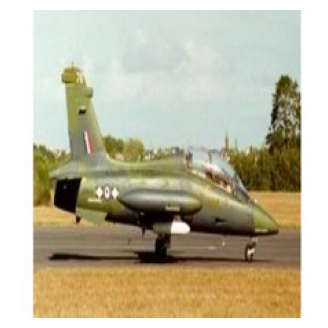

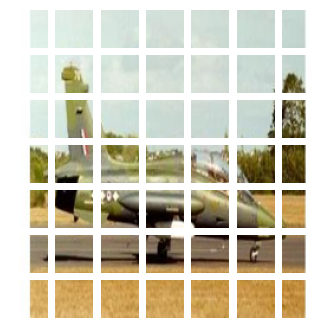

In [13]:
patch_size = 32  # tamaño de los parches

plt.figure(figsize=(4, 4))
plt.imshow(x_train[0].astype("uint8"))
plt.axis("off")

patches = Patches(patch_size)(tf.convert_to_tensor([x_train[0]])) #Utilizamos la clase Patches para extraer los parches de la imagen
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"{patches.shape[1]} patches per image \n{patches.shape[-1]} elements per patch")

n = int(np.sqrt(patches.shape[1])) #Número de parches a mostrar
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

#### 1.4.2 Patch Encoder

El enconder de los parches es una parte fundamental de nuestro modelo, ya que le da continuidad y orden a los parches de la imagen, si por el contrario no utilizaramos los embeddings de la poscicion de cada parche, el modelo juntaria los parches de manera aleatoria y la imagen resultante no tendria coherencia ni sentido, es por esto que utilizar la informacion de la posicion de cada parche es fundamental para el buen funcionamiento del modelo.

In [14]:
class PatchEncoder(keras.layers.Layer): #Clase para codificar los parches
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches                              #Número de parches
        self.projection = keras.layers.Dense(units=projection_dim)  #Capa densa para codificar los parches
        self.position_embedding = keras.layers.Embedding(input_dim=num_patches, output_dim=projection_dim) #Capa de embedding para codificar la posición de los parches

    def call(self, patch): #Función para codificar los parches
        positions = tf.range(start=0, limit=self.num_patches, delta=1) #Creamos un vector con la posición de los parches
        encoded = self.projection(patch) + self.position_embedding(positions) #Concatemanos los embeddings de los parches con los embeddings de su posición
        return encoded

#### 1.4.3 MLP

In [15]:
def mlp(x, hidden_units, dropout_rate): #Función para crear la capa MLP

    #Iteramos sobre las unidades de la capa
    for units in hidden_units:
        #Añadimos una capa densa con activación gelu
        x = keras.layers.Dense(units, activation=tf.nn.gelu)(x)
        #Añadimos una capa de dropout
        x = keras.layers.Dropout(dropout_rate)(x)

    return x

**Pregunta: Que beneficios tiene GeLU por sobre ReLU?**

**Respuesta:** Los beneficios de GeLU [https://arxiv.org/abs/1606.08415] sobre ReLU son:
- Soluciona el *Dying ReLU problem* que consiste en que, cuando una neurona alcanza un peso negativo deja de aprender y siempre devolverá el mismo valor (0), una vez que la función ReLU termina en este estado no se puede recuperar, ya que su gradiente será 0, por lo que el descenso de la gradiente no alterara su peso.
- Se encontro que tiene mejor rendimiento en tareas como *computer vision* y *NPL*.
- Es Suave y Diferenciable.

#### 1.4.4 ViT

In [16]:
def ViT(input_shape,patch_size,num_patches,projection_dim,num_heads,transformer_units,transformer_layers,mlp_head_units):

    inputs = keras.layers.Input(shape=input_shape)

    # Creamos los parches
    patches = Patches(patch_size)(inputs)

    # Codificamos los parches
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    # Creamos n capas de encoders
    for _ in range(transformer_layers):

        # Layer normalization 1.
        x1 = keras.layers.LayerNormalization()(encoded_patches)

        #multi-head self-attention layer.
        attention_output = keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim
        )(x1, x1)

        # Skip connection 1.
        x2 = keras.layers.Add()([attention_output, encoded_patches])

        # Layer normalization 2.
        x3 = keras.layers.LayerNormalization()(x2)

        # MLP
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)

        # Skip connection 2.
        encoded_patches = keras.layers.Add()([x3, x2])

    # Hacemos un Flatten de los parches codificados para pasarlos por la capa MLP Final
    representation = keras.layers.LayerNormalization()(encoded_patches)
    representation = keras.layers.Flatten()(representation)
    representation = keras.layers.Dropout(0.2)(representation)

    # MLP final Head.
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.2)

    # Capa densa de 4 unidades para predecir las 4 coordenadas de la bounding box
    bounding_box = keras.layers.Dense(units=4)(features)

    return keras.Model(inputs=inputs, outputs=bounding_box)

### 1.5 Entrenamiento

#### 1.5.1 Hiperparámetros

In [46]:
batch_size = 32
num_epochs = 100

input_shape = (image_size, image_size, 3)
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [
    projection_dim * 2,
    projection_dim,
]

transformer_layers = 4
mlp_head_units = [2048, 1024, 512, 64, 32]

#### 1.5.2 Creamos el Vision Transformer

In [47]:
model = ViT(
    input_shape,
    patch_size,
    num_patches,
    projection_dim,
    num_heads,
    transformer_units,
    transformer_layers,
    mlp_head_units,
)

#### 1.5.3 Agregamos el optimizador y la funcion de pérdida

In [48]:
adamw_opt = tf.keras.optimizers.AdamW()
mse_loss = tf.keras.losses.MeanSquaredError()

model.compile(optimizer=adamw_opt, loss=mse_loss)

**Pregunta: Que Busca Solucionar AdamW de Adam?**

**Respuesta:** AdamW corrije la forma en la que se maneja el *weight decay* separandolo de la gradiente. El *weight decay* es un tipo de regularización que disminuye los pesos mientras más pequeños sean, al aplicarlo en Adam se observo que no funcionaba de la forma esperada, esto debido a como Adam ajusta las actualizaciones basándose en los momentos de los gradientes. AdamW aplica el *weight decay* directamente a los pesos, lo que proporciona la regularización deseada, esto muestra un mejor desempeño en la generalización.

#### 1.5.4 Creamos nuestro callback de Early Stopping

In [49]:
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=10, restore_best_weights=True)

#### 1.5.5 Entrenamos el modelo

In [50]:
history = model.fit(
        x=x_train,
        y=y_train,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_split=0.1,
        callbacks=es_callback,
    )

Epoch 1/100
18/18 [==============================] - 14s 80ms/step - loss: 0.9471 - val_loss: 0.1355
Epoch 2/100
18/18 [==============================] - 1s 33ms/step - loss: 0.2338 - val_loss: 0.1064
Epoch 3/100
18/18 [==============================] - 1s 34ms/step - loss: 0.1520 - val_loss: 0.0456
Epoch 4/100
18/18 [==============================] - 1s 32ms/step - loss: 0.0937 - val_loss: 0.0074
Epoch 5/100
18/18 [==============================] - 1s 34ms/step - loss: 0.0629 - val_loss: 0.0067
Epoch 6/100
18/18 [==============================] - 1s 33ms/step - loss: 0.0491 - val_loss: 0.0029
Epoch 7/100
18/18 [==============================] - 1s 33ms/step - loss: 0.0357 - val_loss: 0.0019
Epoch 8/100
18/18 [==============================] - 1s 34ms/step - loss: 0.0262 - val_loss: 0.0014
Epoch 9/100
18/18 [==============================] - 1s 32ms/step - loss: 0.0235 - val_loss: 0.0012
Epoch 10/100
18/18 [==============================] - 1s 31ms/step - loss: 0.0213 - val_loss: 0.001

### 1.6 IoU

Intersection Over Union (IoU) es una métrica de evaluación común para la detección de objetos. Se utiliza para medir la superposición entre el área predicha y el área de destino. La superposición se calcula como el área de intersección entre las áreas predichas y de destino dividida por el área de unión entre las áreas predichas y de destino.

![Foto](https://www.baeldung.com/wp-content/uploads/sites/4/2022/04/fig1.png)

#### 1.6.1 Función de IoU

In [51]:
def bounding_box_intersection_over_union(box_predicted, box_truth): #Función para calcular el IoU entre dos bounding boxes

    # obtenemos las coordenadas (x, y) de la intereseccion de las bounding boxes
    top_x_intersect = max(box_predicted[0], box_truth[0])
    top_y_intersect = max(box_predicted[1], box_truth[1])
    bottom_x_intersect = min(box_predicted[2], box_truth[2])
    bottom_y_intersect = min(box_predicted[3], box_truth[3])

    # calculamos el area de la intereseccion
    intersection_area = max(0, bottom_x_intersect - top_x_intersect + 1) * max(0, bottom_y_intersect - top_y_intersect + 1)

    # calculamos el area de las bounding boxe predicha y real
    box_predicted_area = (box_predicted[2] - box_predicted[0] + 1) * (box_predicted[3] - box_predicted[1] + 1)
    box_truth_area = (box_truth[2] - box_truth[0] + 1) * (box_truth[3] - box_truth[1] + 1)

    # Calculamos el IoU dividiendo el area de la intereseccion por la suma del area de las bounding boxes predicha y real menos el area de la intereseccion
    IoU = intersection_area / float(box_predicted_area + box_truth_area - intersection_area)

    # retornamos el IoU
    return IoU

#### 1.6.2 Visualización de IoU

1/1 [==============================] - 0s 41ms/step
mean_iou: 0.8831176019253288


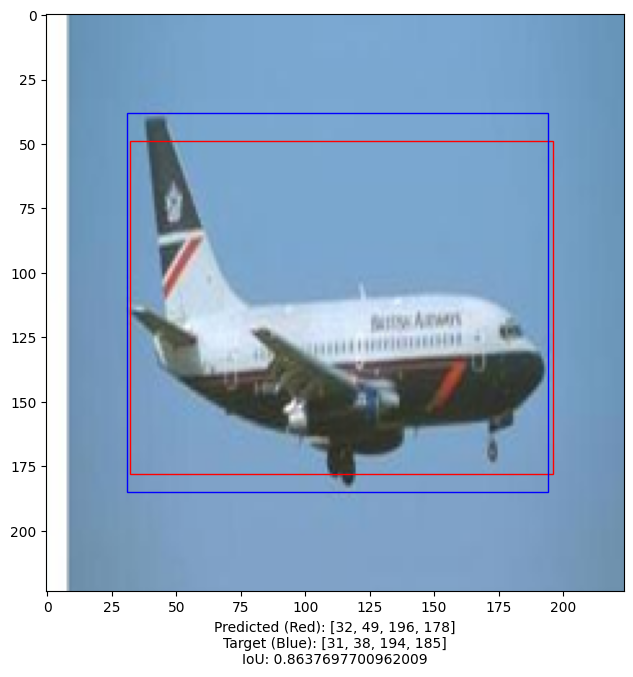

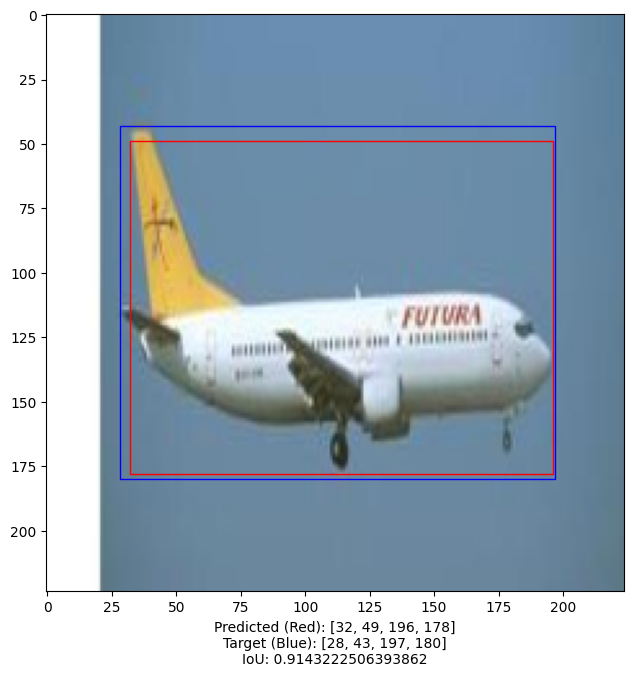

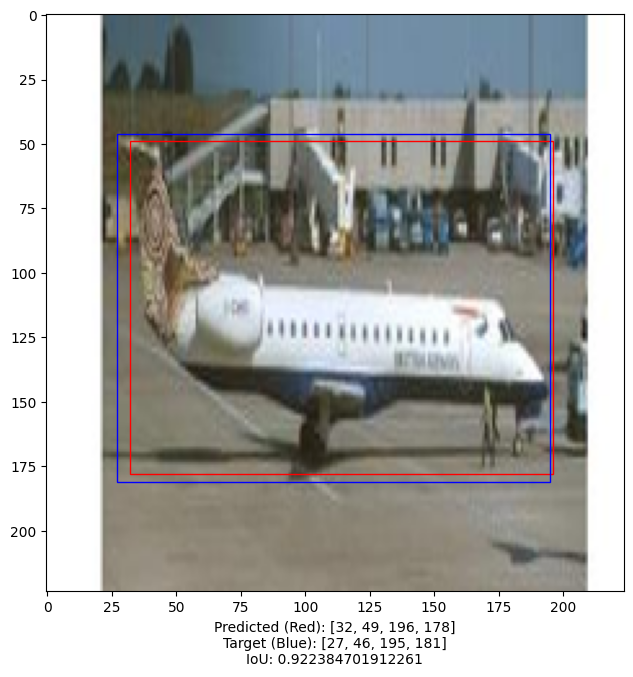

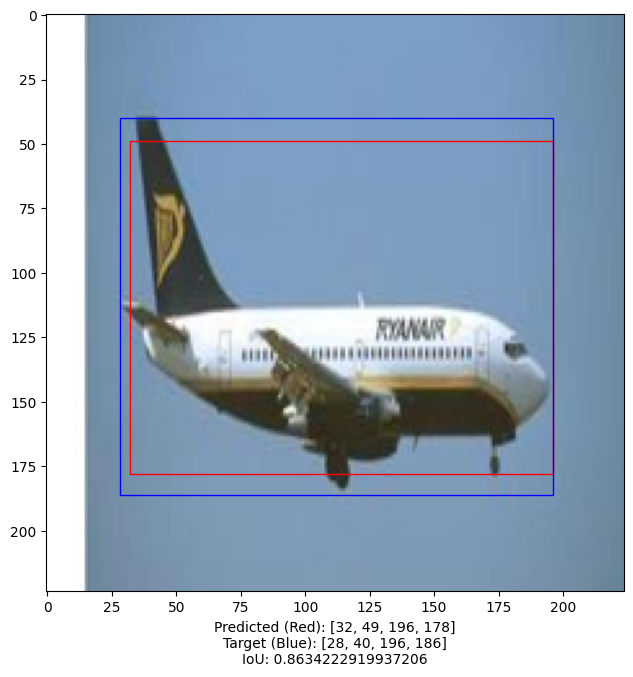

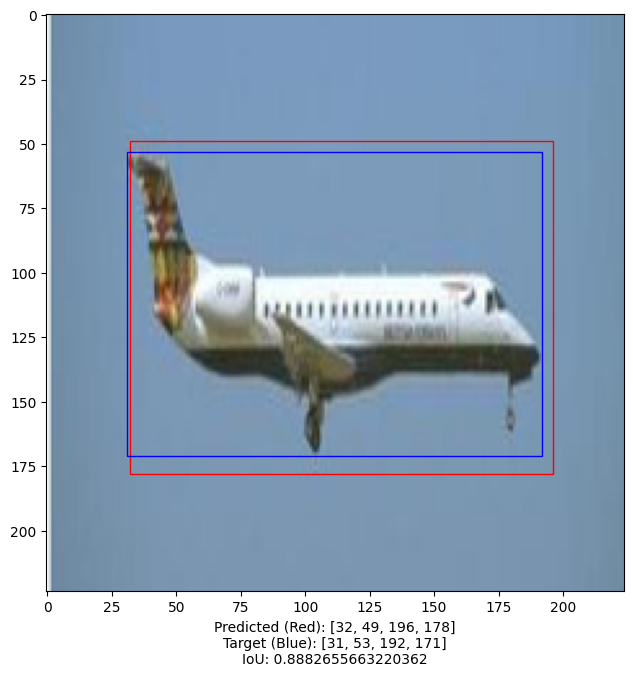

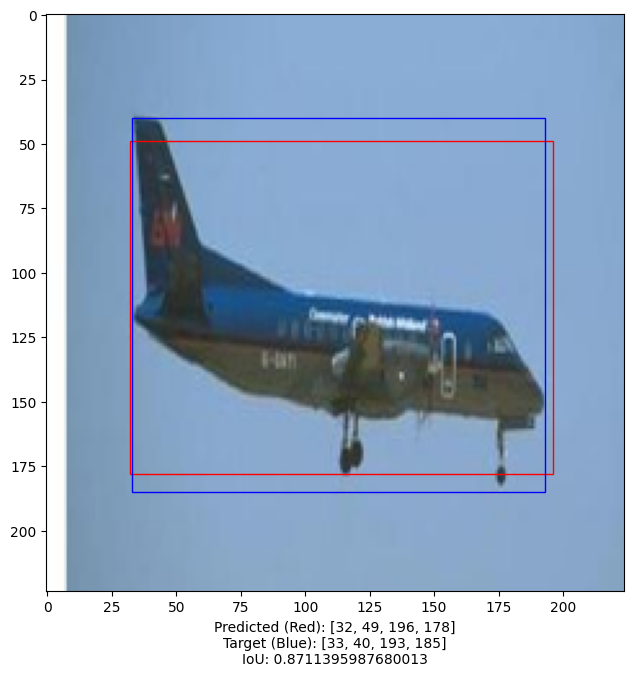

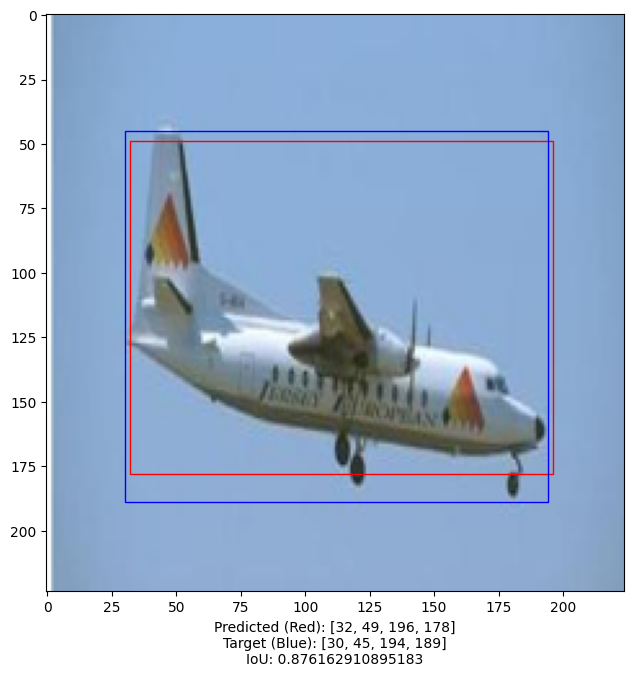

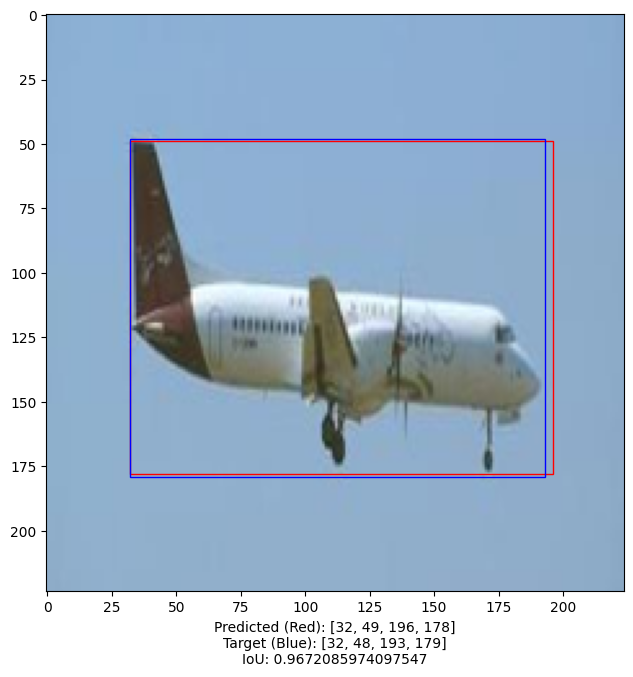

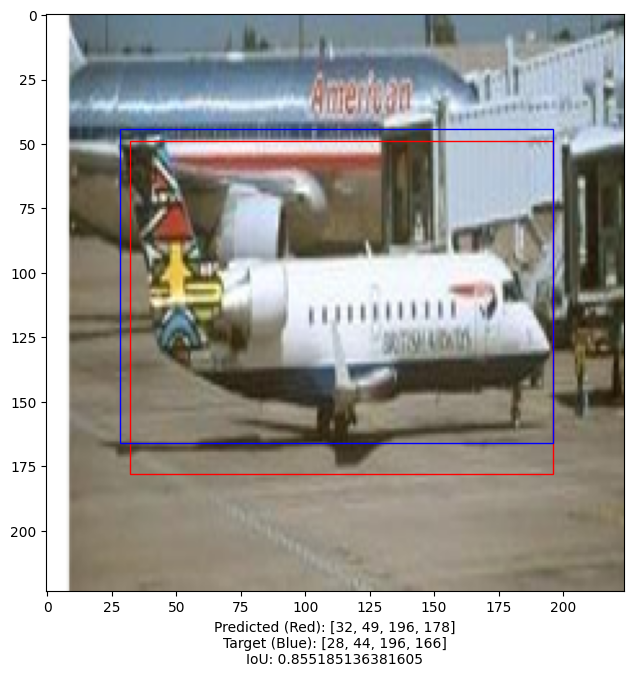

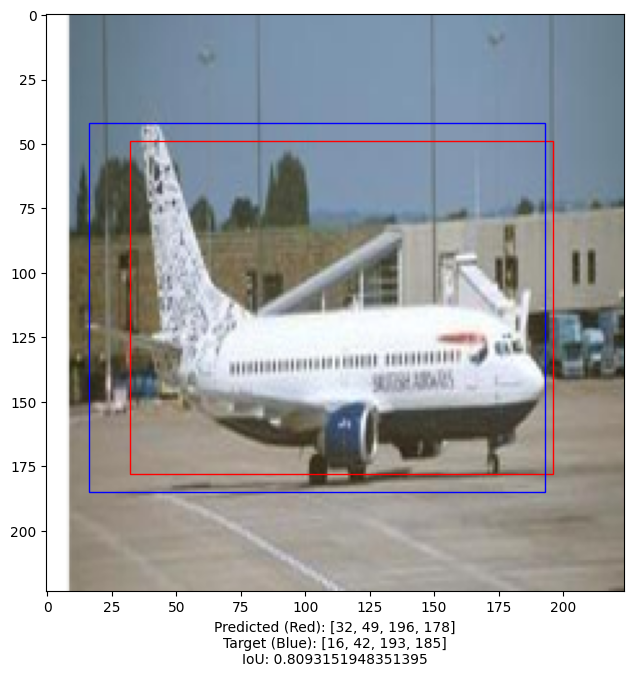

In [52]:
import matplotlib.patches as patches

max_test_imgs = 10
i, mean_iou = 0, 0

# Iteramos sobre las imágenes de test
for input_image in x_test[:max_test_imgs]:
    fig, ax = plt.subplots(figsize=(7.5, 7.5))
    im = input_image

    # Mostramos la imagen original
    ax.imshow(im.astype("uint8"))

    # Redimensionamos la imagen
    input_image = cv2.resize(input_image, (image_size, image_size), interpolation=cv2.INTER_AREA)
    input_image = np.expand_dims(input_image, axis=0)

    # Predecimos las coordenadas de la bounding box
    preds = model.predict(input_image)[0]
    (h, w) = im.shape[0:2]
    top_left_x_pred, top_left_y_pred = int(preds[0] * w), int(preds[1] * h)
    bottom_right_x_pred, bottom_right_y_pred = int(preds[2] * w), int(preds[3] * h)
    box_predicted = [top_left_x_pred, top_left_y_pred, bottom_right_x_pred, bottom_right_y_pred]

    # Creamos el rectángulo de la bounding box predicha
    rect_pred = patches.Rectangle(
        (top_left_x_pred, top_left_y_pred),
        bottom_right_x_pred - top_left_x_pred,
        bottom_right_y_pred - top_left_y_pred,
        facecolor="none",
        edgecolor="red",
        linewidth=1,
    )
    ax.add_patch(rect_pred)

    # Obtenemos las coordenadas de la bounding box real
    top_left_x_true, top_left_y_true = int(y_test[i][0] * w), int(y_test[i][1] * h)
    bottom_right_x_true, bottom_right_y_true = int(y_test[i][2] * w), int(y_test[i][3] * h)
    box_truth = [top_left_x_true, top_left_y_true, bottom_right_x_true, bottom_right_y_true]

    # Creamos el rectángulo de la bounding box real
    rect_true = patches.Rectangle(
        (top_left_x_true, top_left_y_true),
        bottom_right_x_true - top_left_x_true,
        bottom_right_y_true - top_left_y_true,
        facecolor="none",
        edgecolor="blue",
        linewidth=1,
    )
    ax.add_patch(rect_true)

    # Calculamos el IoU entre la bounding box predicha y la real
    iou_value = bounding_box_intersection_over_union(box_predicted, box_truth)
    mean_iou += iou_value

    ax.set_xlabel(
        "Predicted (Red): "
        + str(box_predicted)
        + "\nTarget (Blue): "
        + str(box_truth)
        + "\nIoU: "
        + str(iou_value)
    )
    i += 1

# Mostramos el IoU medio
print("mean_iou: " + str(mean_iou / len(x_test[:10])))
plt.show()

Aca podemos ver en rojo la bounding box predicha y en Azul la bounding box real, y en la parte Inferior podemos ver el valor de IoU.

## Parte 2: Segmentación semántica

La segmentación semántica es una tarea de visión por computadora en la que el objetivo es categorizar cada píxel de una imagen en una clase u objeto. El objetivo es producir un mapa de segmentación de píxeles de una imagen, donde cada píxel se asigna a una clase u objeto específico. Los modelos generalmente se evalúan con las métricas Mean Intersection-Over-Union (Mean IoU) y Precisión de píxeles.

![SS](https://uploads-ssl.webflow.com/614c82ed388d53640613982e/63f498f8d4fe7da3b3a60cc2_semantic%20segmentation%20vs%20instance%20segmentation.jpg)

### Dataset

Cityscapes [https://www.cityscapes-dataset.com/] es un dataset etiquetado de videos de automoviles conduciendo en Alemania. Esta versión es una muestra preprocesada creada como parte del paper Pix2Pix. El conjunto de datos tiene imágenes de los videos originales y las etiquetas de segmentación se muestran junto a la imagen original. Este es uno de los mejores conjuntos de datos que existen para tareas de segmentación semántica.

Este conjunto de datos tiene 2975 archivos de imágenes de entrenamiento y 500 archivos de imágenes de validación. Cada archivo de imagen tiene 256x512 píxeles y cada archivo es una composición con la foto original en la mitad izquierda de la imagen, junto con la imagen etiquetada (salida de la segmentación semántica) en la mitad derecha.

Cuenta con anotaciones de píxeles semánticas para 30 clases agrupadas en 8 categorías (superficies planas, humanos, vehículos, construcciones, objetos, naturaleza, cielo y vacío).

![Foto](cityscapes_data/val/1.jpg)

### 2.1 Librerias Utilizadas

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import os
from tqdm import tqdm
import warnings
import seaborn as sns

warnings.filterwarnings("ignore")

In [ ]:
# Si desea preprocesar las imagenes en local utilize estas funciones, de lo contrario puede utilizar los tensores que vienen en la carpeta cityscapes_data/npy/

# Funciones para procesar las imágenes desde el archivo image_processing.py
from image_processing import process_image, process_image_batch

# Librería para paralelizar el procesamiento de las imágenes
import multiprocessing

### 2.2 Funciones de ayuda

In [9]:
def preprocess(path, id_map): # Función para preprocesar las imágenes

    # Cargamos la imagen
    img = Image.open(path)

    # Separamos la imagen de la mascara y la redimensionamos
    img1 = img.crop((0, 0, 256, 256)).resize((128,128))
    img2 = img.crop((256, 0, 512, 256)).resize((128,128))

    # normalizamos la imagen
    img1 = np.array(img1) / 255.
    img2 = np.array(img2)

    # Creamos una máscara vacía
    mask = np.zeros(shape=(img2.shape[0], img2.shape[1]), dtype = np.uint32)

    # Iteramos sobre la imagen para asignar un id a cada color de la mascara
    for row in range(img2.shape[0]):
        for col in range(img2.shape[1]):
            a = img2[row, col, :]
            final_key = None
            final_d = None
            for key, value in id_map.items():
                d = np.sum(np.sqrt(pow(a - value, 2)))
                if final_key == None:
                    final_d = d
                    final_key = key
                elif d < final_d:
                    final_d = d
                    final_key = key
            mask[row, col] = final_key

    # Añadimos una dimensión a la máscara para poder utilizarla de manera correcta en el modelo
    mask = np.reshape(mask, (mask.shape[0], mask.shape[1], 1))

    del img2 # Eliminamos la imagen de la máscara para liberar memoria

    # Devolvemos la imagen y la máscara
    return img1, mask

In [10]:
# Función principal para preparar el conjunto de datos
def prepare_tensor_dataset(train_path, val_path):
    X_train = []
    Y_train = []
    X_val = []
    Y_val = []

    # Procesa las imágenes de entrenamiento en paralelo
    train_files = [os.path.join(train_path, file) for file in os.listdir(train_path)]
    num_cores = multiprocessing.cpu_count()
    pool = multiprocessing.Pool(processes=num_cores)
    results_train = pool.map(process_image_batch, np.array_split(train_files, num_cores))
    pool.close()
    pool.join()

    # Guardamos las imágenes y las máscaras en listas
    for result_batch in results_train:
        for img, mask in result_batch:
            X_train.append(img)
            Y_train.append(mask)

    # Procesa las imágenes de validación en paralelo
    val_files = [os.path.join(val_path, file) for file in os.listdir(val_path)]
    pool = multiprocessing.Pool(processes=num_cores)
    results_val = pool.map(process_image_batch, np.array_split(val_files, num_cores))
    pool.close()
    pool.join()

    # Guardamos las imágenes y las máscaras en listas
    for result_batch in results_val:
        for img, mask in result_batch:
            X_val.append(img)
            Y_val.append(mask)

    return X_train, Y_train, X_val, Y_val

### 2.3 Mapa de Segmentación

In [11]:
id_map = {
    0: (0, 0, 0), # unlabelled
    1: (111, 74,  0), #static
    2: ( 81,  0, 81), #ground
    3: (128, 64,127), #road
    4: (244, 35,232), #sidewalk
    5: (250,170,160), #parking
    6: (230,150,140), #rail track
    7: (70, 70, 70), #building
    8: (102,102,156), #wall
    9: (190,153,153), #fence
    10: (180,165,180), #guard rail
    11: (150,100,100), #bridge
    12: (150,120, 90), #tunnel
    13: (153,153,153), #pole
    14: (153,153,153), #polegroup
    15: (250,170, 30), #traffic light
    16: (220,220,  0), #traffic sign
    17: (107,142, 35), #vegetation
    18: (152,251,152), #terrain
    19: ( 70,130,180), #sky
    20: (220, 20, 60), #person
    21: (255,  0,  0), #rider
    22: (  0,  0,142), #car
    23: (  0,  0, 70), #truck
    24: (  0, 60,100), #bus
    25: (  0,  0, 90), #caravan
    26: (  0,  0,110), #trailer
    27: (  0, 80,100), #train
    28: (  0,  0,230), #motorcycle
    29: (119, 11, 32), #bicycle
    30: (  0,  0,142) #license plate
}

category_map = {
    0: 0,
    1: 0,
    2: 0,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    7: 2,
    8: 2,
    9: 2,
    10: 2,
    11: 2,
    12: 2,
    13: 3,
    14: 3,
    15: 3,
    16: 3,
    17: 4,
    18: 4,
    19: 5,
    20: 6,
    21: 6,
    22: 7,
    23: 7,
    24: 7,
    25: 7,
    26: 7,
    27: 7,
    28: 7,
    29: 7,
    30: 7
}

# Número de clases
num_classes = len(id_map.keys())

### 2.4.1 Procesamiento de las Imágenes

Si va a preprocesar las imagenes en local corra las siguientes celdas, sino puede saltar a la celda 1.4.3 y cargar los tensores directamente ya que el preprocesamiento demora bastante.

In [ ]:
X_train, Y_train, X_valid, Y_valid = prepare_tensor_dataset("cityscapes_data/train/", "cityscapes_data/val/")

Processing: 100%|██████████| 50/50 [15:18<00:00, 18.37s/it]


In [ ]:
X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_valid = np.array(X_valid)
Y_valid = np.array(Y_valid)

#### 2.4.2 Guardamos los tensores para no tener que volver a procesarlos

In [ ]:
np.save('cityscapes_data/npy/X_train.npy', X_train)
np.save('cityscapes_data/npy/Y_train.npy', Y_train)
np.save('cityscapes_data/npy/X_valid.npy', X_valid)
np.save('cityscapes_data/npy/Y_valid.npy', Y_valid)

#### 2.4.3 Cargamos los tensores preprocesados

In [12]:
X_train = np.load('cityscapes_data/npy/X_train.npy')
Y_train = np.load('cityscapes_data/npy/Y_train.npy')
X_valid = np.load('cityscapes_data/npy/X_valid.npy')
Y_valid = np.load('cityscapes_data/npy/Y_valid.npy')

### 2.5 Metricas y Callbacks

In [13]:
class UpdatedMeanIoU(tf.keras.metrics.MeanIoU): # Clase para calcular el Mean IoU
  def __init__(self, y_true=None, y_pred=None, num_classes=None, name=None, dtype=None):
    super(UpdatedMeanIoU, self).__init__(num_classes = num_classes,name=name, dtype=dtype)

  def update_state(self, y_true, y_pred, sample_weight=None): # Función para actualizar el estado del Mean IoU
    y_pred = tf.math.argmax(y_pred, axis=-1)
    return super().update_state(y_true, y_pred, sample_weight)

class VizCallback(tf.keras.callbacks.Callback): # Clase para visualizar las predicciones del modelo

    def __init__(self, file_path, **kwargs):
        super().__init__(**kwargs)
        self.file_path = file_path

    def on_epoch_end(self, epoch, logs=None): # Función para visualizar las predicciones del modelo al final de cada época
        #plt.style.use("default")
        img, mask = preprocess(self.file_path, id_map)
        img = np.array(img)
        img = np.reshape(img, (1, 128, 128, 3))
        pred = model.predict(img)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (128, 128))
        fig, axes = plt.subplots(nrows = 1, ncols = 2)
        axes[0].imshow(mask)
        axes[0].set_title("Original Mask")
        axes[1].imshow(y_pred)
        axes[1].set_title("Predicted Mask")
        plt.tight_layout()
        plt.show()

def plot_history(history): # Función para visualizar las métricas de entrenamiento y validación
  fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(20, 7))
  sns.lineplot

  #training
  sns.lineplot(history.history["loss"], ax = axes[0], label="Training Loss")
  sns.lineplot(history.history["accuracy"], ax = axes[1], label="Training Accuracy")
  sns.lineplot(history.history["mean_iou"], ax = axes[2], label="Training Mean IOU")

  # Validacion
  sns.lineplot(history.history["val_loss"], ax = axes[0], label="Validation Loss")
  sns.lineplot(history.history["val_accuracy"], ax = axes[1], label="Validation Accuracy")
  sns.lineplot(history.history["val_mean_iou"], ax = axes[2], label="Validation Mean IOU")

  axes[0].set_title("Loss Comparison", fontdict = {'fontsize': 15})
  axes[0].set_xlabel("Epoch")
  axes[0].set_ylabel("Loss")

  axes[1].set_title("Accuracy Comparison", fontdict = {'fontsize': 15})
  axes[1].set_xlabel("Epoch")
  axes[1].set_ylabel("Accuracy")

  axes[2].set_title("Mean IOU Comparison", fontdict = {'fontsize': 15})
  axes[2].set_xlabel("Epoch")
  axes[2].set_ylabel("Mean IOU")
  plt.tight_layout()
  plt.show()

### 2.6 Modelos para Segmentación Semántica

En esta sección se presentaran 2 modelos para segmentacion Semantica, el primero ya esta implementado y sirve como ejemplo de prueba, ya que para el segundo modelo ustedes deberan completar el modelo y asegurarse de que funcione de manera correcta.

#### 2.6.1 PSPnet

PSPNet [https://www.computer.org/csdl/proceedings-article/cvpr/2017/0457g230/12OmNvrMUeP], o Pyramid Scene Parsing Network, es un modelo de segmentación semántica que utiliza un módulo de parsing piramidal.

Dada una imagen de entrada, PSPNet utiliza una CNN dilatada previamente entrenada para extraer los feature maps. El tamaño final feature map es 1/8 de la imagen de entrada. En la parte superior del feature map, utilizamos un modulo de pooling piramidal (pyramid pooling module) para recopilar información de contexto.
Usando una pirámide de 4 niveles, los kernels cubren la totalidad, la mitad y pequeñas porciones de la imagen.
Después se combinan los 4 feature maps para generar el prior global, y este se concatena con el feature map original, y se pasa por una capa de convolución para generar el mapa de predicción final.

![pspnet](https://production-media.paperswithcode.com/methods/new_pspnet-eps-converted-to.jpg)

In [9]:
def conv_block(X,filters):
    f1,f2,f3 = filters
    X_skip = X

    # block_a
    X = tf.keras.layers.Convolution2D(filters=f1, kernel_size=(1,1), dilation_rate=(1,1), padding='same', kernel_initializer='he_normal')(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.ReLU()(X)

    # block_b
    X = tf.keras.layers.Convolution2D(filters=f2, kernel_size=(3,3), dilation_rate=(2,2), padding='same', kernel_initializer='he_normal')(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.ReLU()(X)

    # block_c
    X = tf.keras.layers.Convolution2D(filters=f3, kernel_size=(1,1), dilation_rate=(1,1), padding='same', kernel_initializer='he_normal')(X)
    X = tf.keras.layers.BatchNormalization()(X)

    # skip_conv
    X_skip = tf.keras.layers.Convolution2D(filters=f3, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(X_skip)
    X_skip = tf.keras.layers.BatchNormalization()(X_skip)

    # block_c + skip_conv
    X = tf.keras.layers.Add()([X,X_skip])
    X = tf.keras.layers.ReLU()(X)

    return X

def base_feature_maps(input_layer):
    # block_1
    base = conv_block(input_layer,[32,32,64])

    # block_2
    base = conv_block(base,[64,64,128])

    # block_3
    base = conv_block(base,[128,128,256])

    return base

def pyramid_feature_maps(input_layer):
    base = base_feature_maps(input_layer)

    # red
    red = tf.keras.layers.GlobalAveragePooling2D()(base)
    red = tf.keras.layers.Reshape((1,1,256))(red)
    red = tf.keras.layers.Convolution2D(filters=64, kernel_size=(1,1))(red)
    red = tf.keras.layers.UpSampling2D(size=128, interpolation='bilinear')(red)

    # yellow
    yellow = tf.keras.layers.AveragePooling2D(pool_size=(2,2))(base)
    yellow = tf.keras.layers.Convolution2D(filters=64, kernel_size=(1,1))(yellow)
    yellow = tf.keras.layers.UpSampling2D(size=2, interpolation='bilinear')(yellow)

    # blue
    blue = tf.keras.layers.AveragePooling2D(pool_size=(4,4))(base)
    blue = tf.keras.layers.Convolution2D(filters=64, kernel_size=(1,1))(blue)
    blue = tf.keras.layers.UpSampling2D(size=4, interpolation='bilinear')(blue)

    # green
    green = tf.keras.layers.AveragePooling2D(pool_size=(8,8))(base)
    green = tf.keras.layers.Convolution2D(filters=64, kernel_size=(1,1))(green)
    green = tf.keras.layers.UpSampling2D(size=8, interpolation='bilinear')(green)

    return tf.keras.layers.concatenate([base,red,yellow,blue,green])

def last_conv_module(input_layer, num_classes):
    x = pyramid_feature_maps(input_layer)
    x = tf.keras.layers.Convolution2D(filters=3, kernel_size=3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(x)

    return outputs

def pspnet(input_shape, num_classes):
    input_layer = tf.keras.layers.Input(shape = input_shape)
    output_layer = last_conv_module(input_layer, num_classes)
    model = tf.keras.Model(inputs=input_layer,outputs=output_layer)

    return model

In [10]:
model = pspnet(input_shape=X_train.shape[1:], num_classes=num_classes)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 32)         128       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 re_lu (ReLU)                (None, 128, 128, 32)         0         ['batch_normalization[0][0

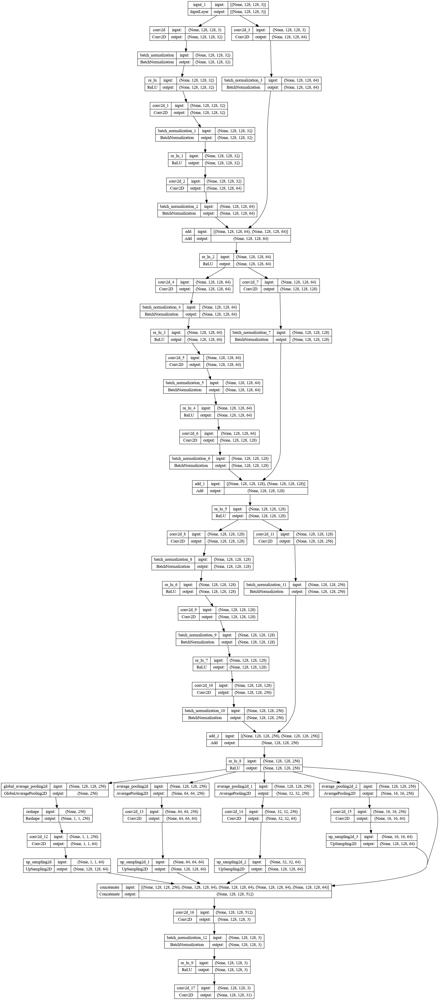

In [ ]:
tf.keras.utils.plot_model(model, show_shapes = True)

In [11]:
model.compile(loss = "sparse_categorical_crossentropy", optimizer = tf.keras.optimizers.Adam(), metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")])

In [12]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("cityscapes_data/val/106.jpg")

Epoch 1/100
1/1 [==============================] - 1s 1s/step


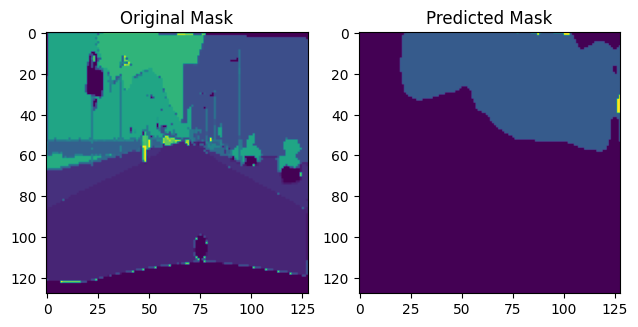

100/100 [==============================] - 144s 1s/step - loss: 2.4719 - accuracy: 0.3850 - mean_iou: 0.0295 - val_loss: 2.5098 - val_accuracy: 0.3915 - val_mean_iou: 0.0214
Epoch 2/100
1/1 [==============================] - 0s 28ms/step


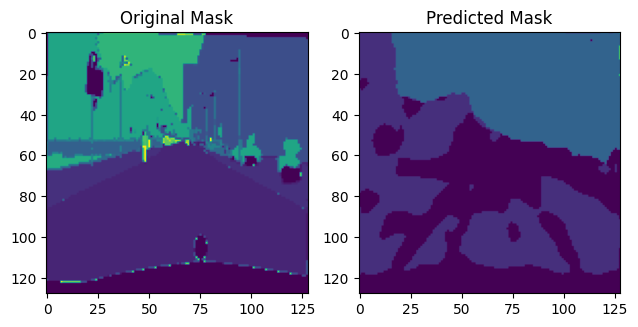

100/100 [==============================] - 92s 917ms/step - loss: 1.5973 - accuracy: 0.5346 - mean_iou: 0.0475 - val_loss: 2.2389 - val_accuracy: 0.3696 - val_mean_iou: 0.0294
Epoch 3/100
1/1 [==============================] - 0s 23ms/step


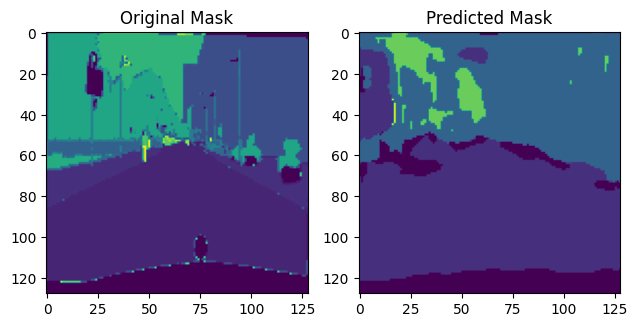

100/100 [==============================] - 91s 915ms/step - loss: 1.4060 - accuracy: 0.5743 - mean_iou: 0.0615 - val_loss: 1.6613 - val_accuracy: 0.5945 - val_mean_iou: 0.0669
Epoch 4/100
1/1 [==============================] - 0s 20ms/step


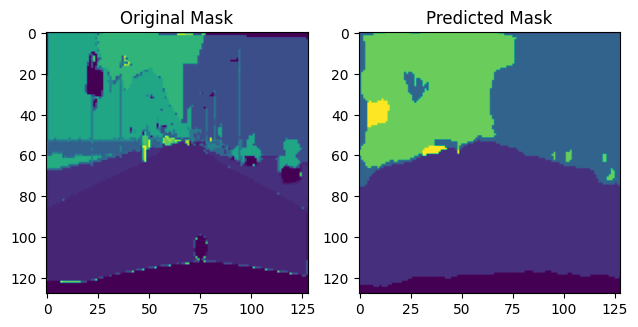

100/100 [==============================] - 92s 919ms/step - loss: 1.2420 - accuracy: 0.6721 - mean_iou: 0.0941 - val_loss: 1.3435 - val_accuracy: 0.6567 - val_mean_iou: 0.0860
Epoch 5/100
1/1 [==============================] - 0s 19ms/step


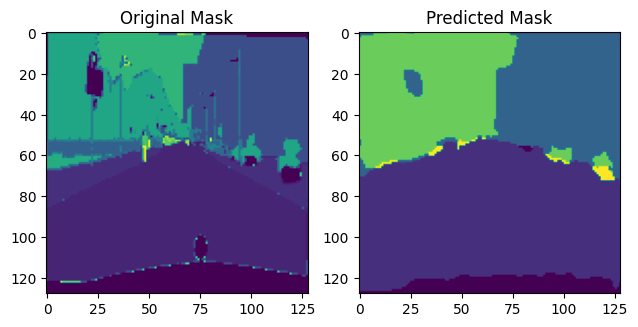

100/100 [==============================] - 92s 926ms/step - loss: 1.1485 - accuracy: 0.6938 - mean_iou: 0.1013 - val_loss: 1.2793 - val_accuracy: 0.6690 - val_mean_iou: 0.0912
Epoch 6/100
1/1 [==============================] - 0s 19ms/step


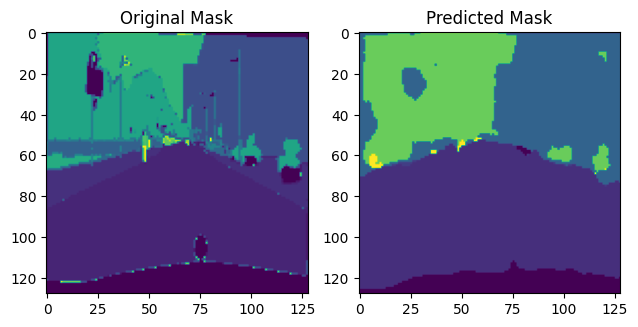

100/100 [==============================] - 92s 917ms/step - loss: 1.0958 - accuracy: 0.7041 - mean_iou: 0.1053 - val_loss: 1.1725 - val_accuracy: 0.7033 - val_mean_iou: 0.1034
Epoch 7/100
1/1 [==============================] - 0s 19ms/step


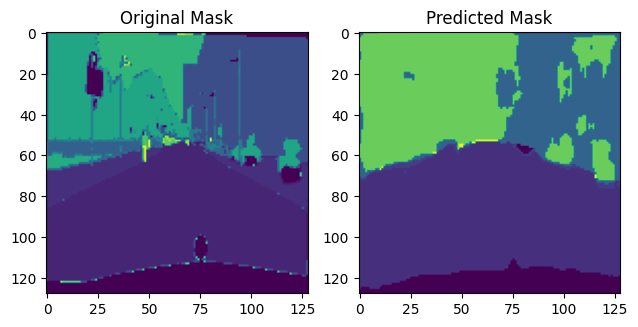

100/100 [==============================] - 91s 915ms/step - loss: 1.0614 - accuracy: 0.7106 - mean_iou: 0.1082 - val_loss: 1.1310 - val_accuracy: 0.6917 - val_mean_iou: 0.1031
Epoch 8/100
1/1 [==============================] - 0s 19ms/step


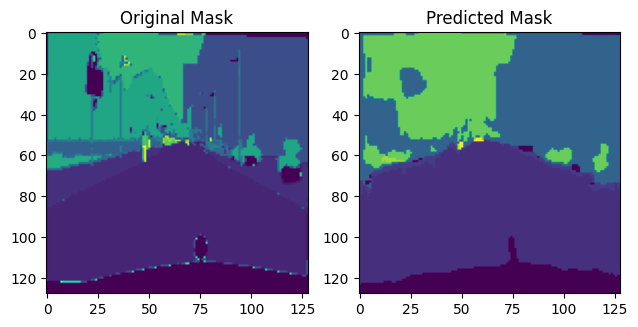

100/100 [==============================] - 93s 931ms/step - loss: 1.0304 - accuracy: 0.7169 - mean_iou: 0.1115 - val_loss: 1.0693 - val_accuracy: 0.7149 - val_mean_iou: 0.1095
Epoch 9/100
1/1 [==============================] - 0s 28ms/step


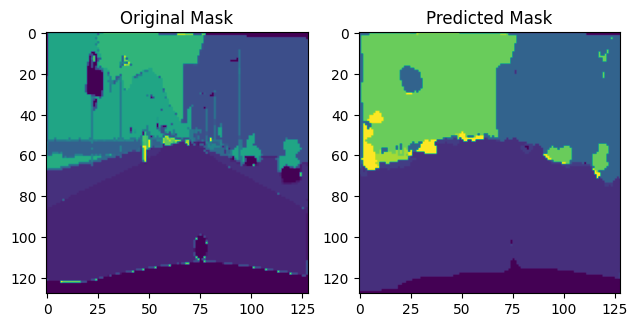

100/100 [==============================] - 92s 916ms/step - loss: 1.0080 - accuracy: 0.7221 - mean_iou: 0.1146 - val_loss: 1.1769 - val_accuracy: 0.6921 - val_mean_iou: 0.1017
Epoch 10/100
1/1 [==============================] - 0s 20ms/step


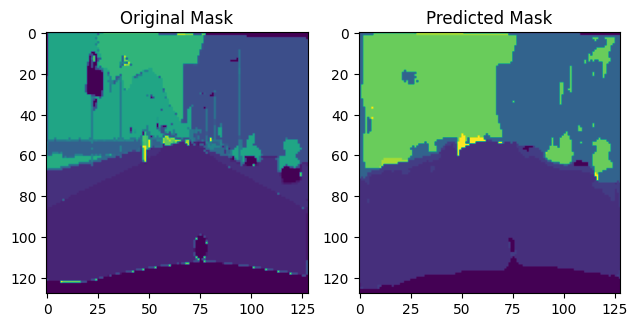

100/100 [==============================] - 91s 915ms/step - loss: 0.9890 - accuracy: 0.7261 - mean_iou: 0.1171 - val_loss: 1.0542 - val_accuracy: 0.7189 - val_mean_iou: 0.1124
Epoch 11/100
1/1 [==============================] - 0s 21ms/step


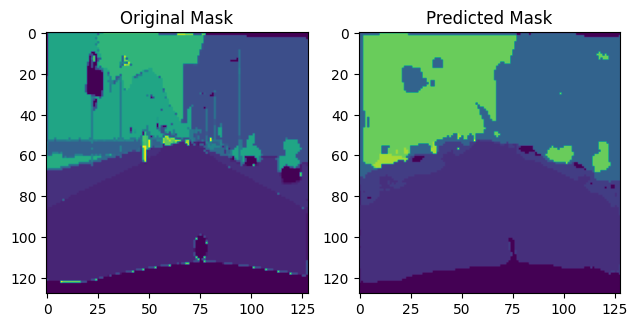

100/100 [==============================] - 92s 921ms/step - loss: 0.9682 - accuracy: 0.7316 - mean_iou: 0.1219 - val_loss: 1.0253 - val_accuracy: 0.7329 - val_mean_iou: 0.1236
Epoch 12/100
1/1 [==============================] - 0s 19ms/step


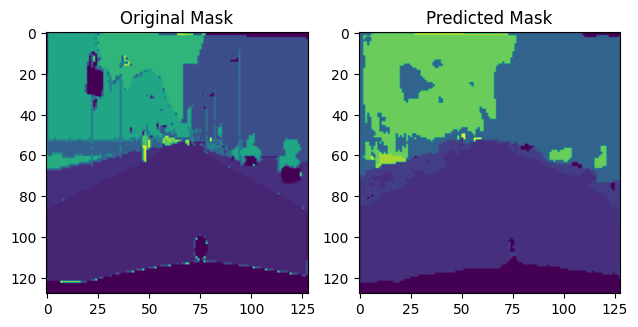

100/100 [==============================] - 93s 932ms/step - loss: 0.9565 - accuracy: 0.7356 - mean_iou: 0.1271 - val_loss: 1.0410 - val_accuracy: 0.7195 - val_mean_iou: 0.1220
Epoch 13/100
1/1 [==============================] - 0s 36ms/step


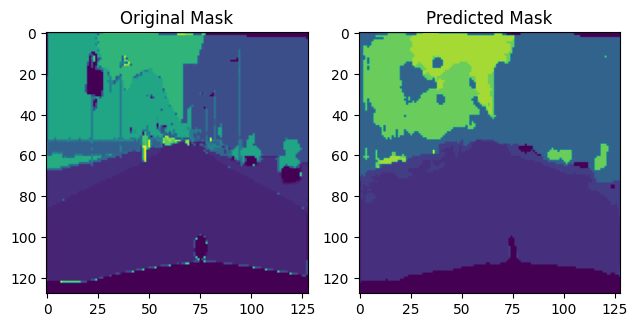

100/100 [==============================] - 92s 922ms/step - loss: 0.9391 - accuracy: 0.7408 - mean_iou: 0.1316 - val_loss: 1.0727 - val_accuracy: 0.7221 - val_mean_iou: 0.1380
Epoch 14/100
1/1 [==============================] - 0s 21ms/step


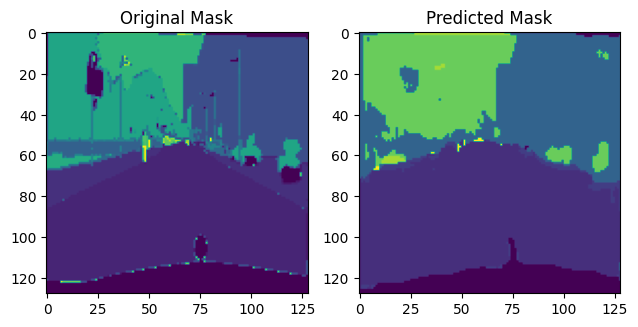

100/100 [==============================] - 92s 917ms/step - loss: 0.9261 - accuracy: 0.7457 - mean_iou: 0.1355 - val_loss: 0.9883 - val_accuracy: 0.7296 - val_mean_iou: 0.1272
Epoch 15/100
1/1 [==============================] - 0s 19ms/step


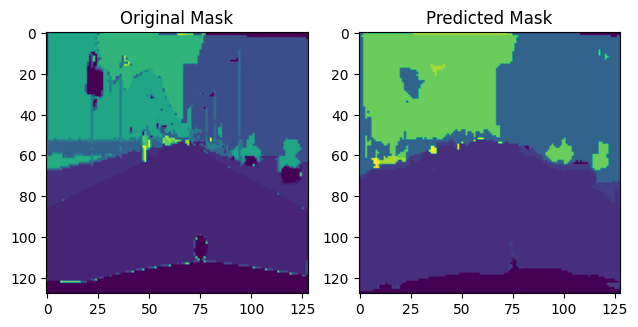

100/100 [==============================] - 93s 929ms/step - loss: 0.9152 - accuracy: 0.7500 - mean_iou: 0.1390 - val_loss: 1.0449 - val_accuracy: 0.7210 - val_mean_iou: 0.1243
Epoch 16/100
1/1 [==============================] - 0s 40ms/step


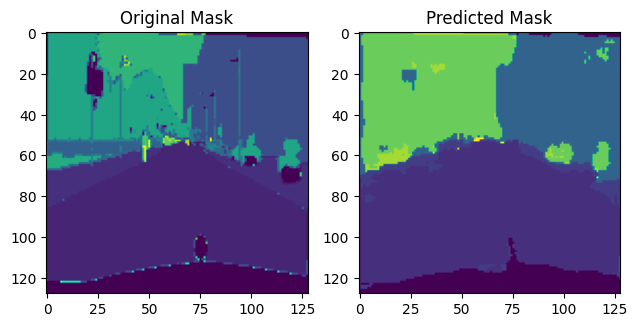

100/100 [==============================] - 92s 925ms/step - loss: 0.9059 - accuracy: 0.7563 - mean_iou: 0.1454 - val_loss: 0.9924 - val_accuracy: 0.7385 - val_mean_iou: 0.1342
Epoch 17/100
1/1 [==============================] - 0s 20ms/step


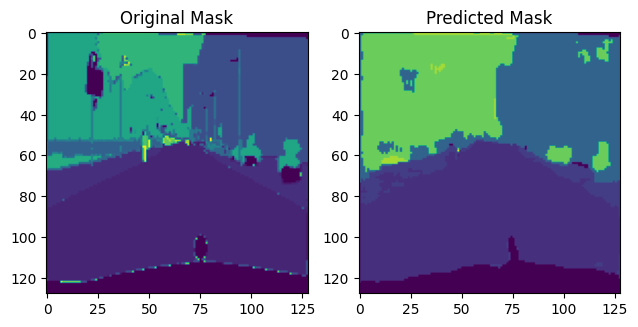

100/100 [==============================] - 91s 910ms/step - loss: 0.8944 - accuracy: 0.7630 - mean_iou: 0.1527 - val_loss: 0.9677 - val_accuracy: 0.7482 - val_mean_iou: 0.1444
Epoch 18/100
1/1 [==============================] - 0s 23ms/step


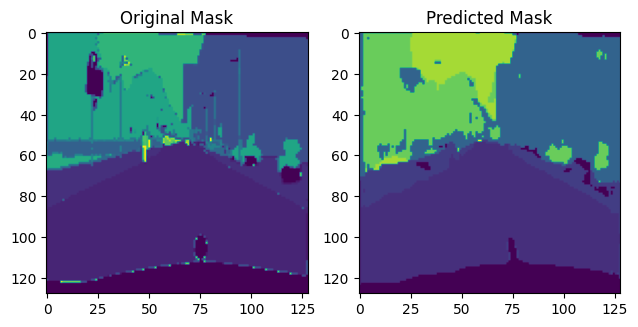

100/100 [==============================] - 91s 916ms/step - loss: 0.8798 - accuracy: 0.7703 - mean_iou: 0.1602 - val_loss: 1.0097 - val_accuracy: 0.7405 - val_mean_iou: 0.1521
Epoch 19/100
1/1 [==============================] - 0s 19ms/step


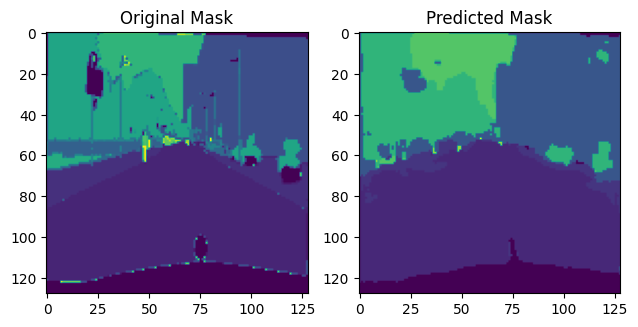

100/100 [==============================] - 94s 942ms/step - loss: 0.8691 - accuracy: 0.7759 - mean_iou: 0.1657 - val_loss: 0.9321 - val_accuracy: 0.7652 - val_mean_iou: 0.1635
Epoch 20/100
1/1 [==============================] - 0s 35ms/step


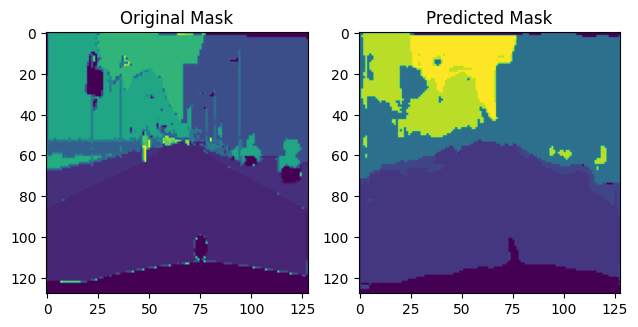

100/100 [==============================] - 92s 923ms/step - loss: 0.8660 - accuracy: 0.7789 - mean_iou: 0.1699 - val_loss: 1.0212 - val_accuracy: 0.7394 - val_mean_iou: 0.1529
Epoch 21/100
1/1 [==============================] - 0s 20ms/step


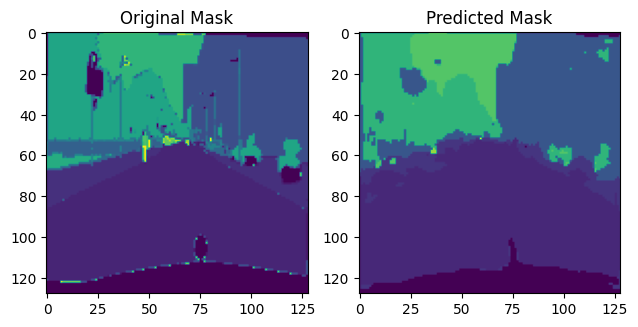

100/100 [==============================] - 91s 909ms/step - loss: 0.8670 - accuracy: 0.7796 - mean_iou: 0.1719 - val_loss: 0.9847 - val_accuracy: 0.7532 - val_mean_iou: 0.1575
Epoch 22/100
1/1 [==============================] - 0s 19ms/step


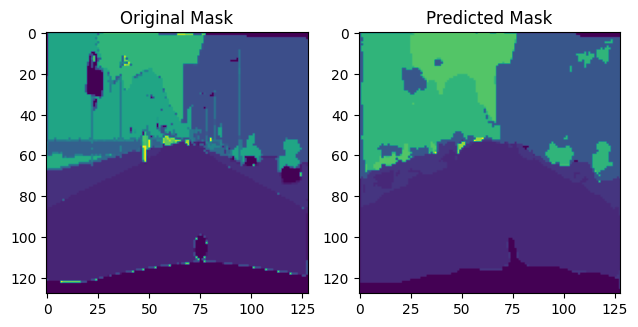

100/100 [==============================] - 92s 926ms/step - loss: 0.8432 - accuracy: 0.7846 - mean_iou: 0.1756 - val_loss: 0.9292 - val_accuracy: 0.7698 - val_mean_iou: 0.1641
Epoch 23/100
1/1 [==============================] - 0s 19ms/step


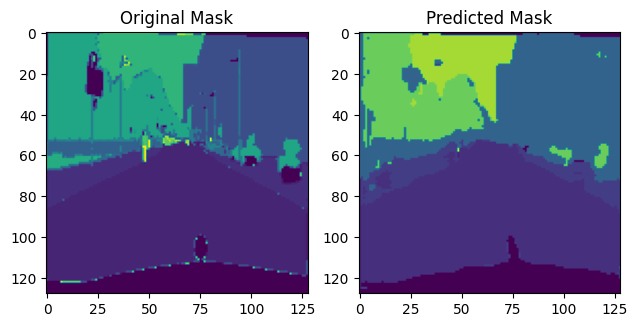

100/100 [==============================] - 93s 932ms/step - loss: 0.8362 - accuracy: 0.7854 - mean_iou: 0.1769 - val_loss: 0.9306 - val_accuracy: 0.7590 - val_mean_iou: 0.1663
Epoch 24/100
1/1 [==============================] - 0s 19ms/step


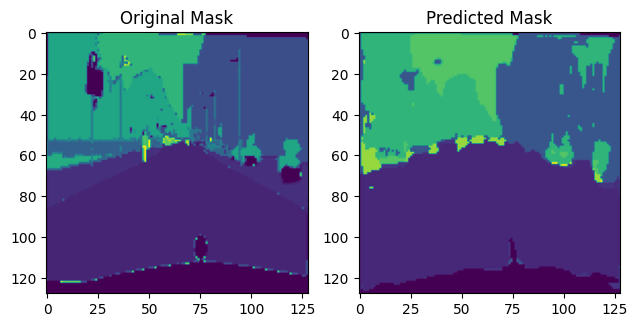

100/100 [==============================] - 91s 915ms/step - loss: 0.8222 - accuracy: 0.7883 - mean_iou: 0.1795 - val_loss: 0.9753 - val_accuracy: 0.7522 - val_mean_iou: 0.1556
Epoch 25/100
1/1 [==============================] - 0s 19ms/step


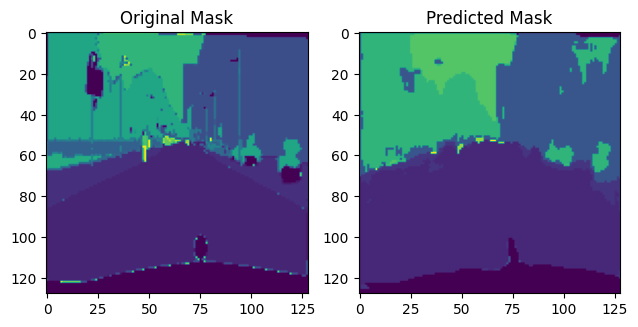

100/100 [==============================] - 91s 909ms/step - loss: 0.8161 - accuracy: 0.7893 - mean_iou: 0.1809 - val_loss: 0.9043 - val_accuracy: 0.7708 - val_mean_iou: 0.1689
Epoch 26/100
1/1 [==============================] - 0s 28ms/step


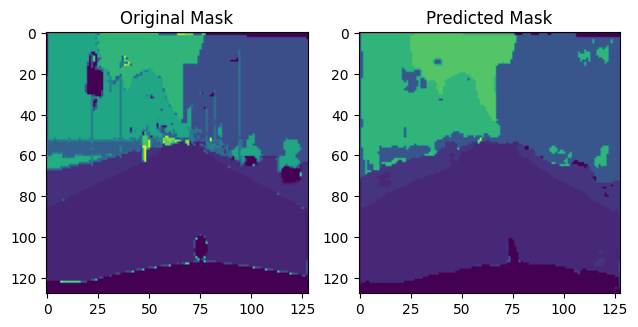

100/100 [==============================] - 94s 939ms/step - loss: 0.8091 - accuracy: 0.7905 - mean_iou: 0.1838 - val_loss: 0.9547 - val_accuracy: 0.7519 - val_mean_iou: 0.1647
Epoch 27/100
1/1 [==============================] - 0s 33ms/step


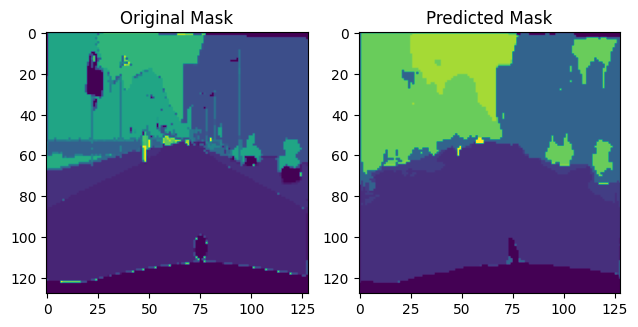

100/100 [==============================] - 92s 919ms/step - loss: 0.7993 - accuracy: 0.7934 - mean_iou: 0.1885 - val_loss: 0.8985 - val_accuracy: 0.7710 - val_mean_iou: 0.1735
Epoch 28/100
1/1 [==============================] - 0s 23ms/step


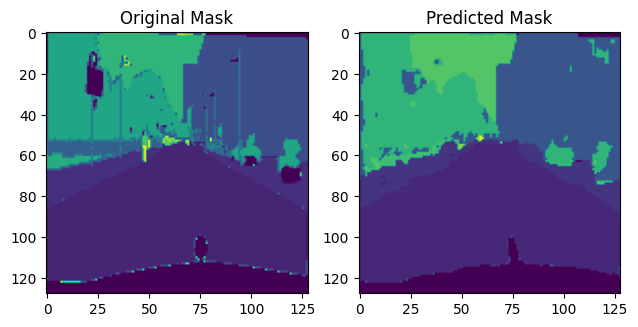

100/100 [==============================] - 91s 916ms/step - loss: 0.7942 - accuracy: 0.7943 - mean_iou: 0.1917 - val_loss: 0.9397 - val_accuracy: 0.7663 - val_mean_iou: 0.1709
Epoch 29/100
1/1 [==============================] - 0s 19ms/step


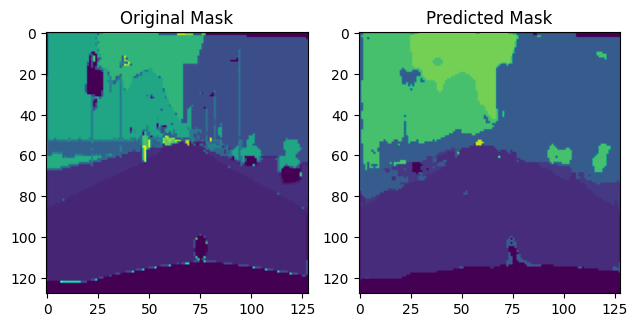

100/100 [==============================] - 92s 926ms/step - loss: 0.7942 - accuracy: 0.7941 - mean_iou: 0.1924 - val_loss: 1.0429 - val_accuracy: 0.7340 - val_mean_iou: 0.1653
Epoch 30/100
1/1 [==============================] - 0s 37ms/step


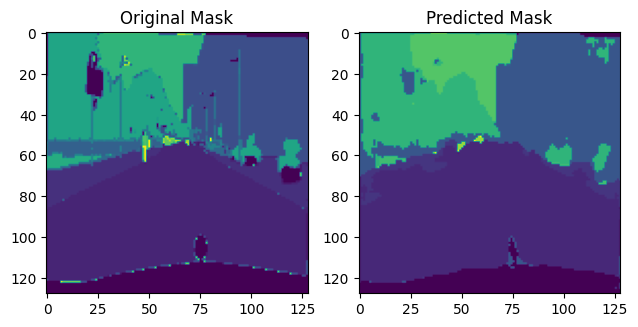

100/100 [==============================] - 93s 929ms/step - loss: 0.7891 - accuracy: 0.7958 - mean_iou: 0.1947 - val_loss: 0.8983 - val_accuracy: 0.7689 - val_mean_iou: 0.1758
Epoch 31/100
1/1 [==============================] - 0s 19ms/step


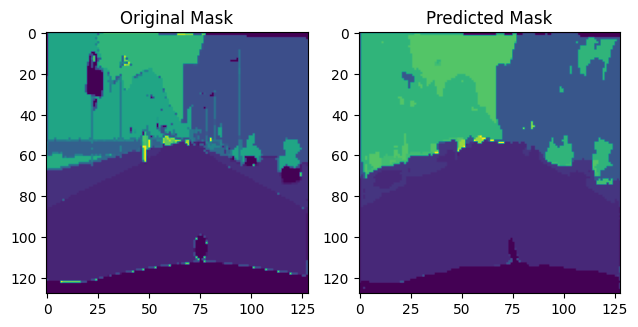

100/100 [==============================] - 92s 917ms/step - loss: 0.7789 - accuracy: 0.7980 - mean_iou: 0.1974 - val_loss: 0.9063 - val_accuracy: 0.7727 - val_mean_iou: 0.1767
Epoch 32/100
1/1 [==============================] - 0s 20ms/step


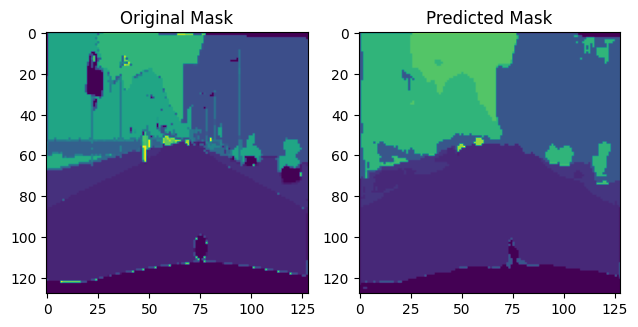

100/100 [==============================] - 92s 923ms/step - loss: 0.7752 - accuracy: 0.7992 - mean_iou: 0.1998 - val_loss: 0.9030 - val_accuracy: 0.7727 - val_mean_iou: 0.1804
Epoch 33/100
1/1 [==============================] - 0s 18ms/step


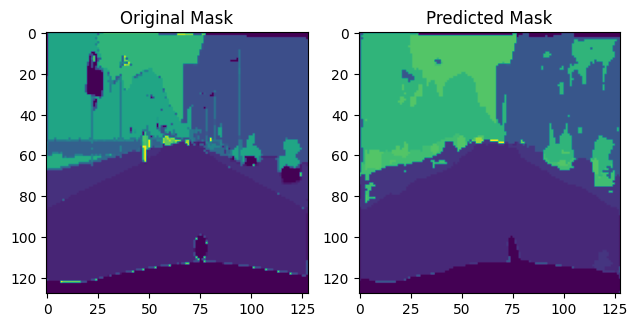

100/100 [==============================] - 93s 928ms/step - loss: 0.7700 - accuracy: 0.8008 - mean_iou: 0.2016 - val_loss: 1.0375 - val_accuracy: 0.7342 - val_mean_iou: 0.1622
Epoch 34/100
1/1 [==============================] - 0s 35ms/step


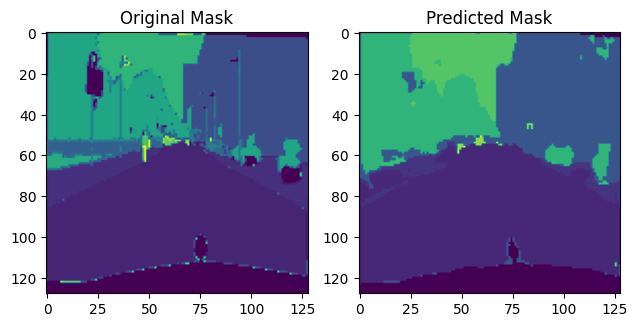

100/100 [==============================] - 92s 919ms/step - loss: 0.7674 - accuracy: 0.8015 - mean_iou: 0.2024 - val_loss: 0.9001 - val_accuracy: 0.7740 - val_mean_iou: 0.1828
Epoch 35/100
1/1 [==============================] - 0s 20ms/step


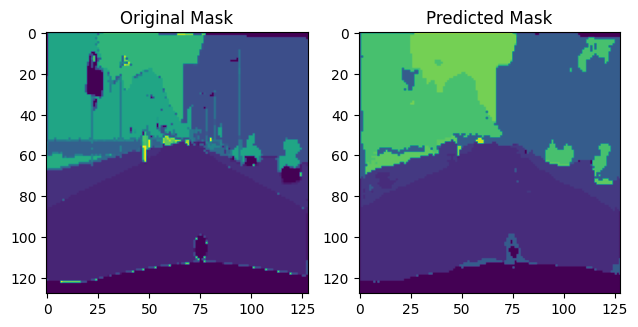

100/100 [==============================] - 91s 909ms/step - loss: 0.7597 - accuracy: 0.8029 - mean_iou: 0.2047 - val_loss: 0.8829 - val_accuracy: 0.7723 - val_mean_iou: 0.1854
Epoch 36/100
1/1 [==============================] - 0s 22ms/step


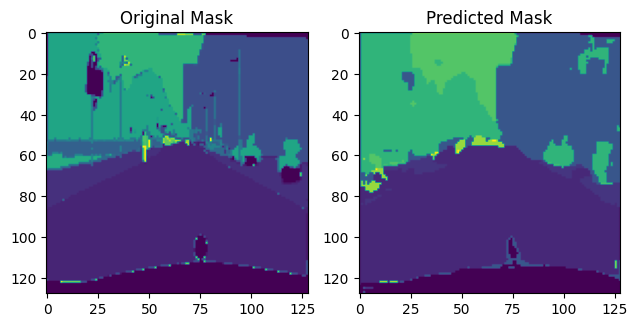

100/100 [==============================] - 93s 928ms/step - loss: 0.7563 - accuracy: 0.8038 - mean_iou: 0.2055 - val_loss: 0.9475 - val_accuracy: 0.7692 - val_mean_iou: 0.1776
Epoch 37/100
1/1 [==============================] - 0s 29ms/step


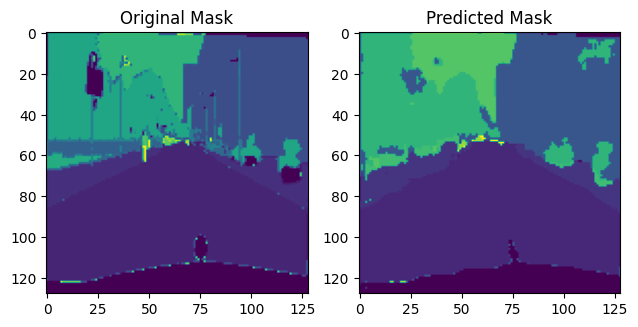

100/100 [==============================] - 92s 920ms/step - loss: 0.7535 - accuracy: 0.8044 - mean_iou: 0.2066 - val_loss: 0.9090 - val_accuracy: 0.7702 - val_mean_iou: 0.1863
Epoch 38/100
1/1 [==============================] - 0s 20ms/step


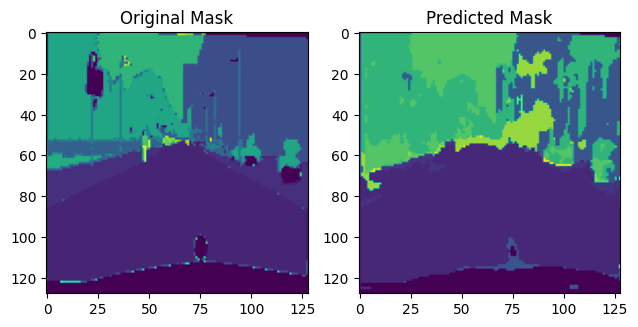

100/100 [==============================] - 91s 907ms/step - loss: 0.7470 - accuracy: 0.8061 - mean_iou: 0.2086 - val_loss: 1.0890 - val_accuracy: 0.7172 - val_mean_iou: 0.1561
Epoch 39/100
1/1 [==============================] - 0s 20ms/step


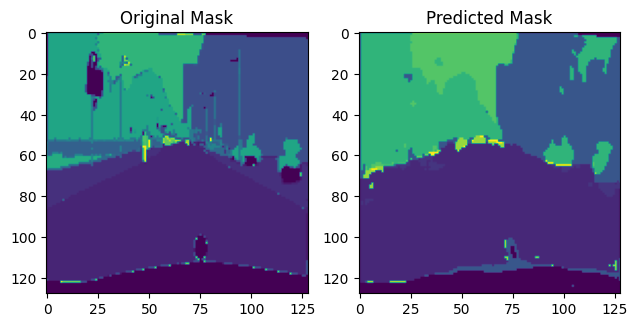

100/100 [==============================] - 92s 924ms/step - loss: 0.7436 - accuracy: 0.8069 - mean_iou: 0.2099 - val_loss: 0.9076 - val_accuracy: 0.7696 - val_mean_iou: 0.1814
Epoch 40/100
1/1 [==============================] - 0s 37ms/step


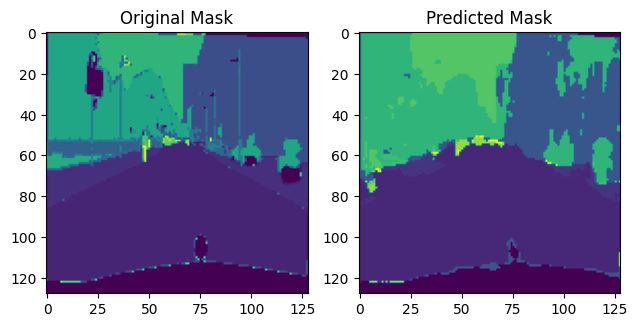

100/100 [==============================] - 91s 912ms/step - loss: 0.7429 - accuracy: 0.8071 - mean_iou: 0.2108 - val_loss: 0.9524 - val_accuracy: 0.7603 - val_mean_iou: 0.1779
Epoch 41/100
1/1 [==============================] - 0s 19ms/step


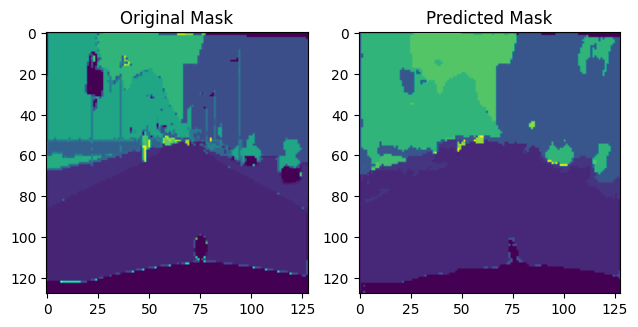

100/100 [==============================] - 91s 909ms/step - loss: 0.7476 - accuracy: 0.8062 - mean_iou: 0.2105 - val_loss: 0.8736 - val_accuracy: 0.7767 - val_mean_iou: 0.1881
Epoch 42/100
1/1 [==============================] - 0s 19ms/step


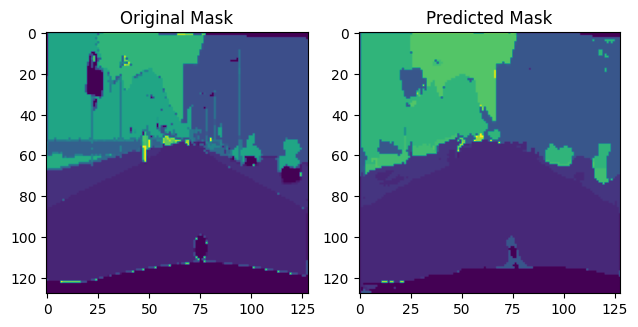

100/100 [==============================] - 92s 925ms/step - loss: 0.7328 - accuracy: 0.8093 - mean_iou: 0.2128 - val_loss: 0.9288 - val_accuracy: 0.7626 - val_mean_iou: 0.1833
Epoch 43/100
1/1 [==============================] - 0s 29ms/step


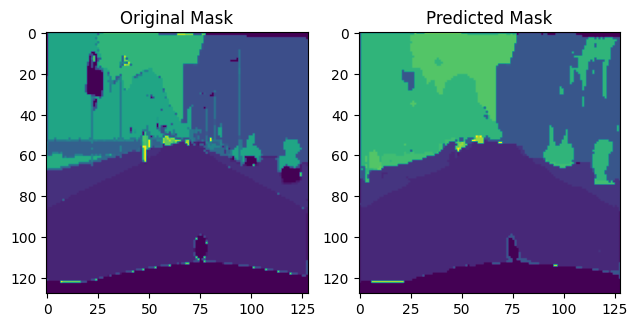

100/100 [==============================] - 92s 924ms/step - loss: 0.7236 - accuracy: 0.8116 - mean_iou: 0.2151 - val_loss: 0.8866 - val_accuracy: 0.7765 - val_mean_iou: 0.1858
Epoch 44/100
1/1 [==============================] - 0s 19ms/step


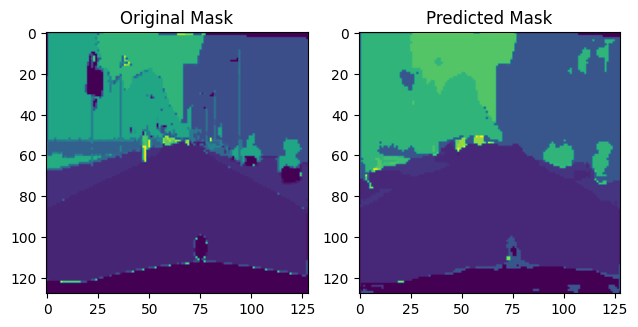

100/100 [==============================] - 92s 917ms/step - loss: 0.7289 - accuracy: 0.8104 - mean_iou: 0.2151 - val_loss: 0.9028 - val_accuracy: 0.7697 - val_mean_iou: 0.1862
Epoch 45/100
1/1 [==============================] - 0s 19ms/step


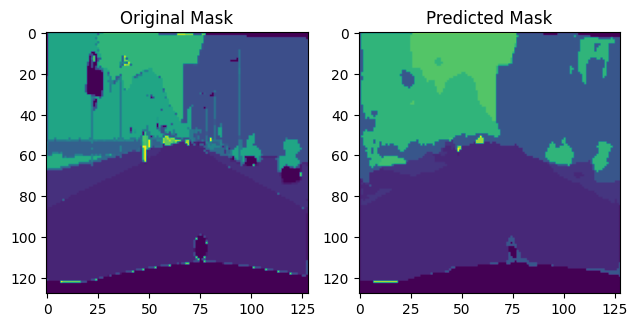

100/100 [==============================] - 92s 920ms/step - loss: 0.7254 - accuracy: 0.8109 - mean_iou: 0.2161 - val_loss: 0.8705 - val_accuracy: 0.7791 - val_mean_iou: 0.1916
Epoch 46/100
1/1 [==============================] - 0s 21ms/step


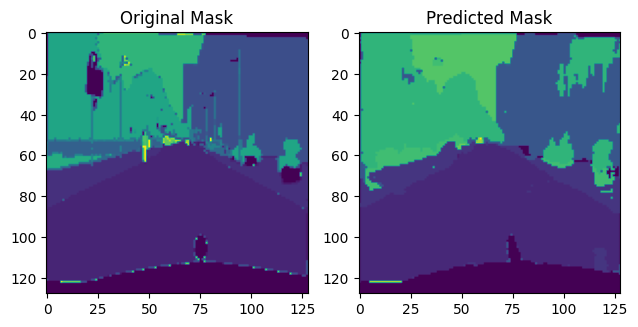

100/100 [==============================] - 93s 930ms/step - loss: 0.7238 - accuracy: 0.8114 - mean_iou: 0.2164 - val_loss: 0.9244 - val_accuracy: 0.7586 - val_mean_iou: 0.1858
Epoch 47/100
1/1 [==============================] - 0s 19ms/step


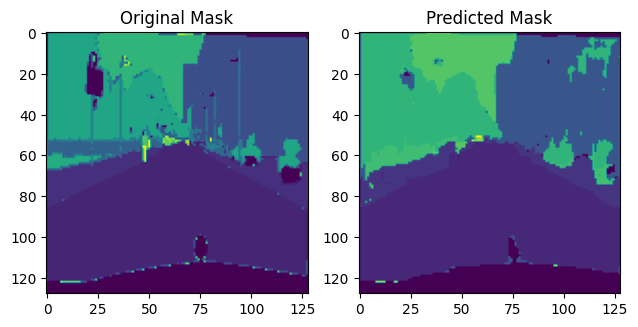

100/100 [==============================] - 92s 918ms/step - loss: 0.7145 - accuracy: 0.8137 - mean_iou: 0.2188 - val_loss: 0.8744 - val_accuracy: 0.7828 - val_mean_iou: 0.1932
Epoch 48/100
1/1 [==============================] - 0s 21ms/step


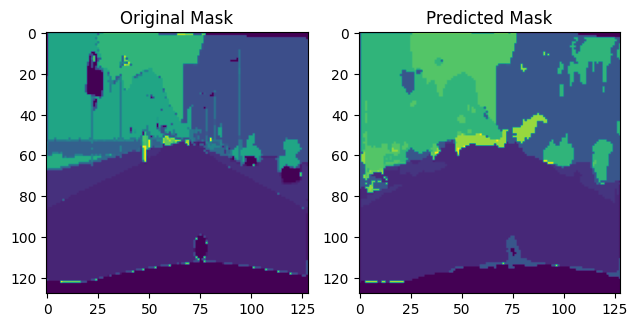

100/100 [==============================] - 92s 917ms/step - loss: 0.7117 - accuracy: 0.8145 - mean_iou: 0.2200 - val_loss: 0.9543 - val_accuracy: 0.7602 - val_mean_iou: 0.1795
Epoch 49/100
1/1 [==============================] - 0s 20ms/step


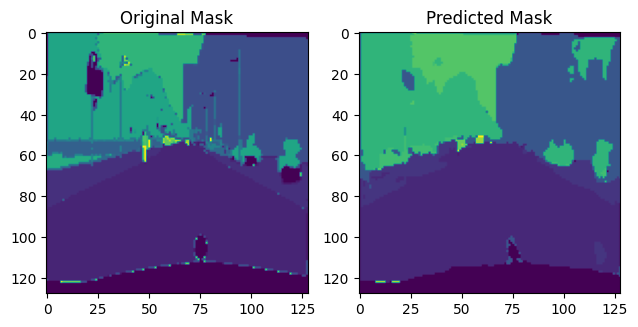

100/100 [==============================] - 93s 931ms/step - loss: 0.7063 - accuracy: 0.8157 - mean_iou: 0.2214 - val_loss: 0.8510 - val_accuracy: 0.7833 - val_mean_iou: 0.1941
Epoch 50/100
1/1 [==============================] - 0s 30ms/step


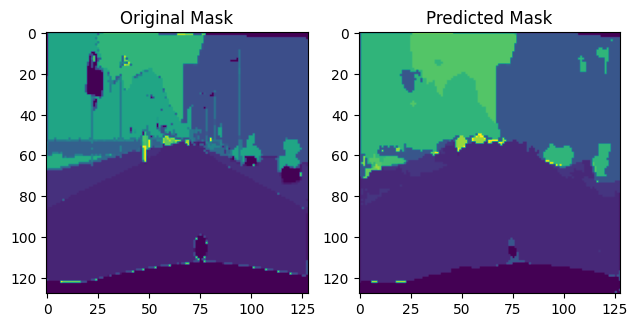

100/100 [==============================] - 92s 919ms/step - loss: 0.7012 - accuracy: 0.8169 - mean_iou: 0.2230 - val_loss: 0.8928 - val_accuracy: 0.7784 - val_mean_iou: 0.1912
Epoch 51/100
1/1 [==============================] - 0s 19ms/step


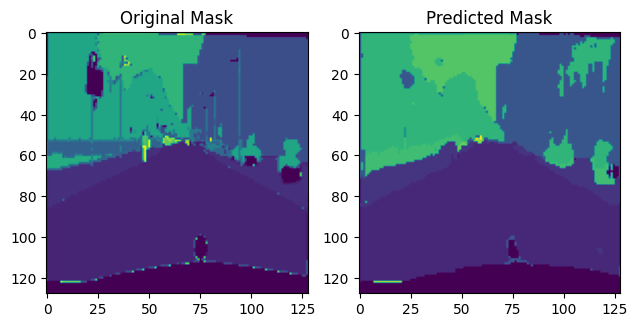

100/100 [==============================] - 91s 915ms/step - loss: 0.6984 - accuracy: 0.8177 - mean_iou: 0.2243 - val_loss: 0.8594 - val_accuracy: 0.7787 - val_mean_iou: 0.1949
Epoch 52/100
1/1 [==============================] - 0s 19ms/step


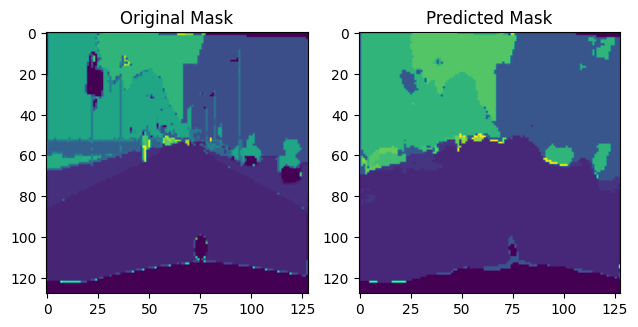

100/100 [==============================] - 92s 925ms/step - loss: 0.6969 - accuracy: 0.8180 - mean_iou: 0.2249 - val_loss: 0.9317 - val_accuracy: 0.7716 - val_mean_iou: 0.1895
Epoch 53/100
1/1 [==============================] - 0s 19ms/step


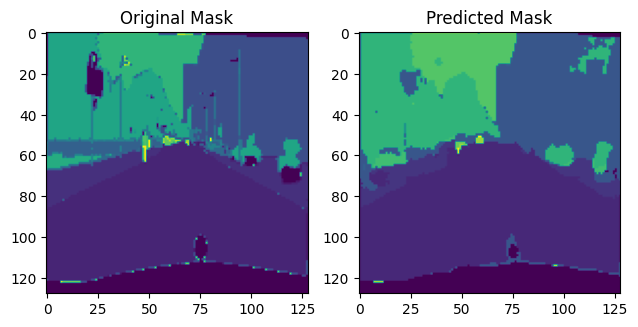

100/100 [==============================] - 93s 931ms/step - loss: 0.6972 - accuracy: 0.8176 - mean_iou: 0.2251 - val_loss: 0.8609 - val_accuracy: 0.7828 - val_mean_iou: 0.1981
Epoch 54/100
1/1 [==============================] - 0s 18ms/step


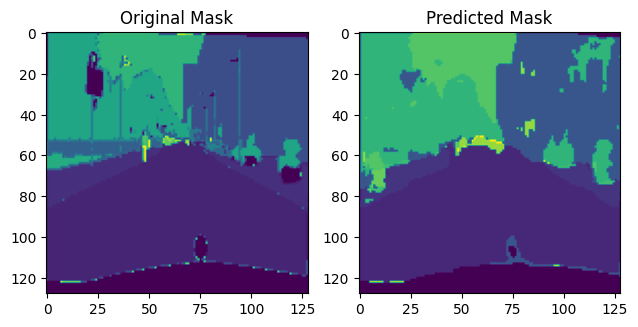

100/100 [==============================] - 92s 920ms/step - loss: 0.6905 - accuracy: 0.8192 - mean_iou: 0.2263 - val_loss: 0.9158 - val_accuracy: 0.7703 - val_mean_iou: 0.1892
Epoch 55/100
1/1 [==============================] - 0s 20ms/step


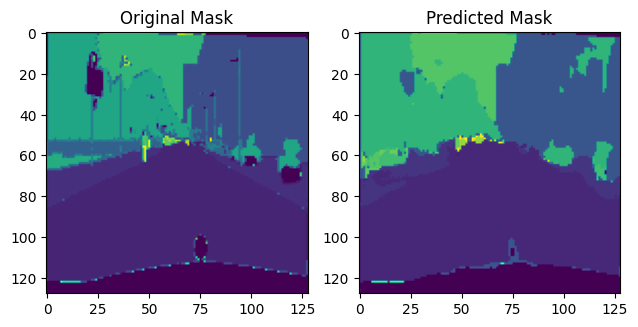

100/100 [==============================] - 91s 909ms/step - loss: 0.6979 - accuracy: 0.8173 - mean_iou: 0.2252 - val_loss: 0.8527 - val_accuracy: 0.7852 - val_mean_iou: 0.2014
Epoch 56/100
1/1 [==============================] - 0s 21ms/step


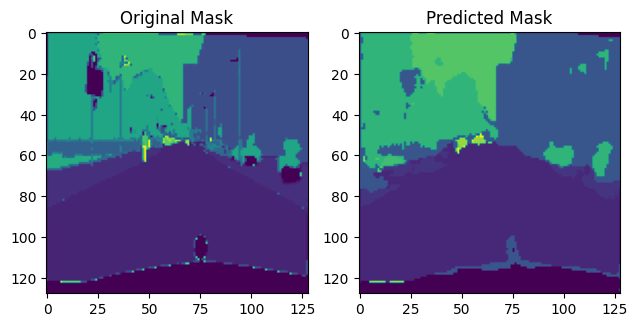

100/100 [==============================] - 93s 931ms/step - loss: 0.6884 - accuracy: 0.8197 - mean_iou: 0.2275 - val_loss: 0.8968 - val_accuracy: 0.7760 - val_mean_iou: 0.1942
Epoch 57/100
1/1 [==============================] - 0s 30ms/step


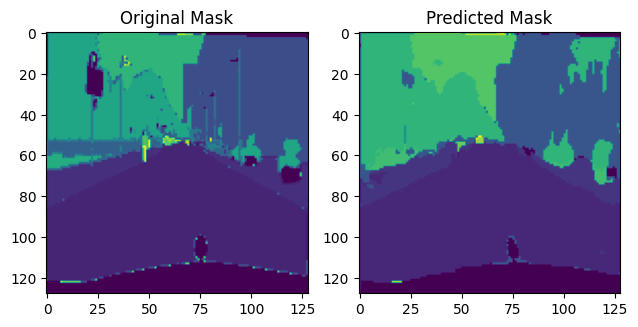

100/100 [==============================] - 92s 925ms/step - loss: 0.6811 - accuracy: 0.8214 - mean_iou: 0.2291 - val_loss: 0.8503 - val_accuracy: 0.7831 - val_mean_iou: 0.1981
Epoch 58/100
1/1 [==============================] - 0s 20ms/step


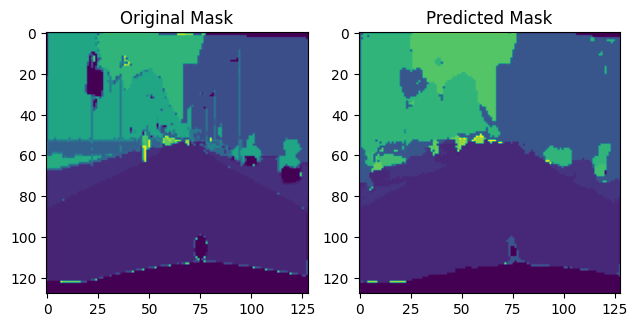

100/100 [==============================] - 91s 909ms/step - loss: 0.6801 - accuracy: 0.8215 - mean_iou: 0.2293 - val_loss: 0.8678 - val_accuracy: 0.7803 - val_mean_iou: 0.2007
Epoch 59/100
1/1 [==============================] - 0s 19ms/step


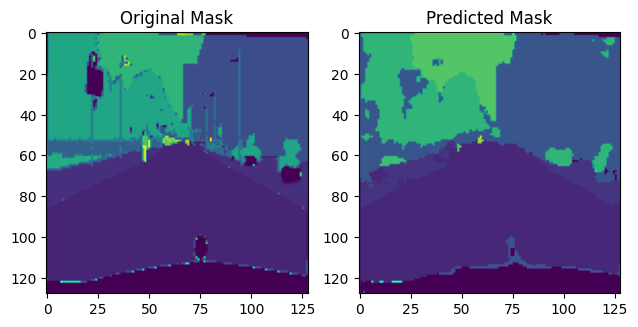

100/100 [==============================] - 92s 924ms/step - loss: 0.6782 - accuracy: 0.8215 - mean_iou: 0.2296 - val_loss: 0.9151 - val_accuracy: 0.7695 - val_mean_iou: 0.1921
Epoch 60/100
1/1 [==============================] - 0s 45ms/step


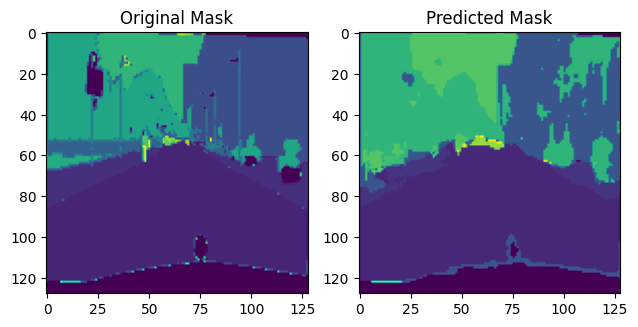

100/100 [==============================] - 93s 934ms/step - loss: 0.6767 - accuracy: 0.8220 - mean_iou: 0.2302 - val_loss: 0.9357 - val_accuracy: 0.7662 - val_mean_iou: 0.1835
Epoch 61/100
1/1 [==============================] - 0s 22ms/step


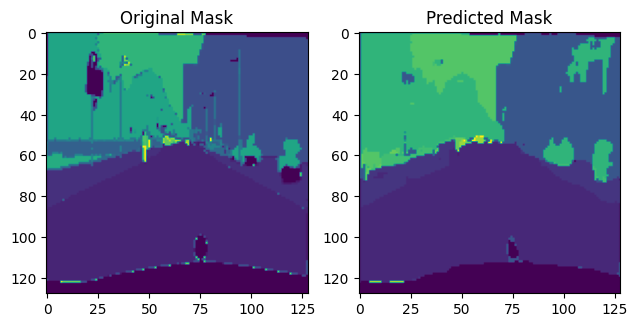

100/100 [==============================] - 92s 918ms/step - loss: 0.6733 - accuracy: 0.8226 - mean_iou: 0.2311 - val_loss: 0.8575 - val_accuracy: 0.7864 - val_mean_iou: 0.2000
Epoch 62/100
1/1 [==============================] - 0s 19ms/step


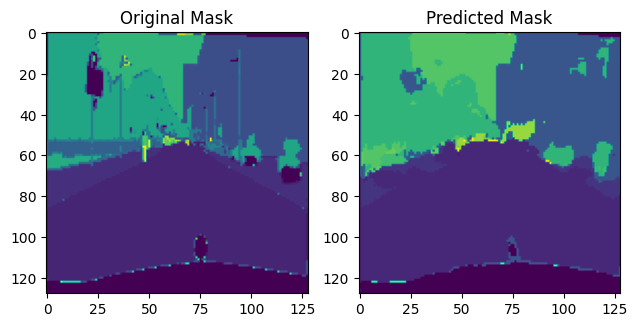

100/100 [==============================] - 91s 915ms/step - loss: 0.6737 - accuracy: 0.8223 - mean_iou: 0.2313 - val_loss: 0.9337 - val_accuracy: 0.7724 - val_mean_iou: 0.1918
Epoch 63/100
1/1 [==============================] - 0s 19ms/step


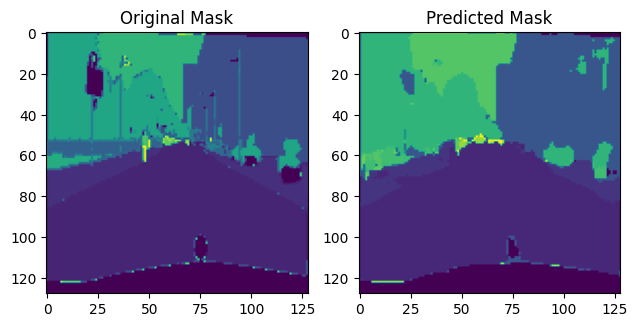

100/100 [==============================] - 93s 931ms/step - loss: 0.6789 - accuracy: 0.8215 - mean_iou: 0.2306 - val_loss: 0.8384 - val_accuracy: 0.7863 - val_mean_iou: 0.2015
Epoch 64/100
1/1 [==============================] - 0s 19ms/step


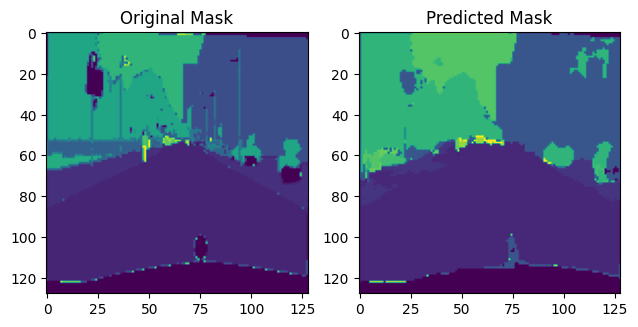

100/100 [==============================] - 91s 911ms/step - loss: 0.6625 - accuracy: 0.8252 - mean_iou: 0.2335 - val_loss: 0.8793 - val_accuracy: 0.7809 - val_mean_iou: 0.1980
Epoch 65/100
1/1 [==============================] - 0s 19ms/step


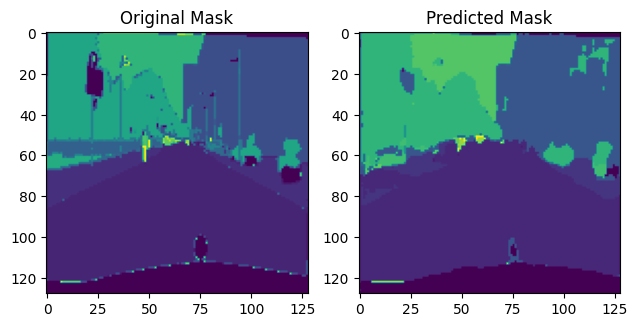

100/100 [==============================] - 91s 907ms/step - loss: 0.6655 - accuracy: 0.8244 - mean_iou: 0.2334 - val_loss: 0.8876 - val_accuracy: 0.7807 - val_mean_iou: 0.1996
Epoch 66/100
1/1 [==============================] - 0s 22ms/step


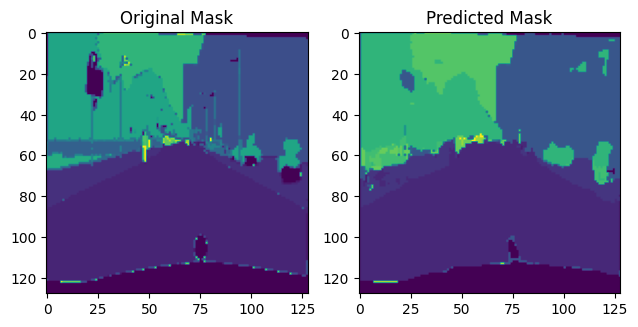

100/100 [==============================] - 93s 929ms/step - loss: 0.6583 - accuracy: 0.8258 - mean_iou: 0.2345 - val_loss: 0.8605 - val_accuracy: 0.7838 - val_mean_iou: 0.2013
Epoch 67/100
1/1 [==============================] - 0s 25ms/step


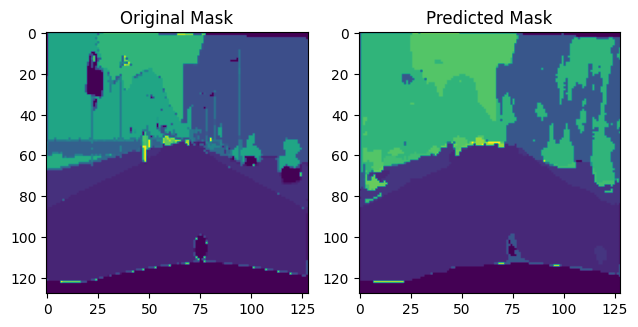

100/100 [==============================] - 91s 913ms/step - loss: 0.6574 - accuracy: 0.8259 - mean_iou: 0.2348 - val_loss: 0.9239 - val_accuracy: 0.7574 - val_mean_iou: 0.1819
Epoch 68/100
1/1 [==============================] - 0s 18ms/step


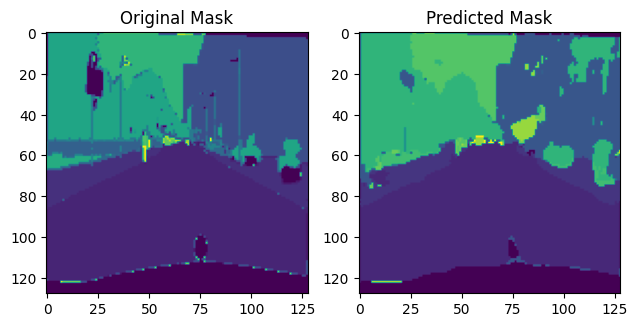

100/100 [==============================] - 91s 908ms/step - loss: 0.6540 - accuracy: 0.8265 - mean_iou: 0.2355 - val_loss: 0.8940 - val_accuracy: 0.7794 - val_mean_iou: 0.1984
Epoch 69/100
1/1 [==============================] - 0s 19ms/step


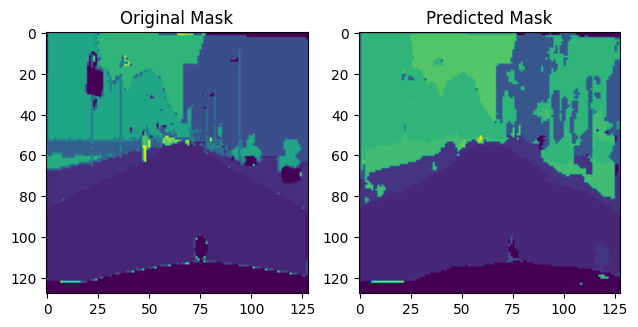

100/100 [==============================] - 92s 922ms/step - loss: 0.6515 - accuracy: 0.8274 - mean_iou: 0.2365 - val_loss: 1.0632 - val_accuracy: 0.7146 - val_mean_iou: 0.1765
Epoch 70/100
1/1 [==============================] - 0s 19ms/step


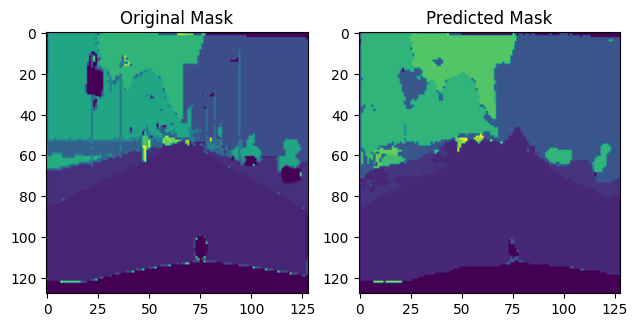

100/100 [==============================] - 91s 913ms/step - loss: 0.6459 - accuracy: 0.8286 - mean_iou: 0.2376 - val_loss: 0.9373 - val_accuracy: 0.7716 - val_mean_iou: 0.1936
Epoch 71/100
1/1 [==============================] - 0s 20ms/step


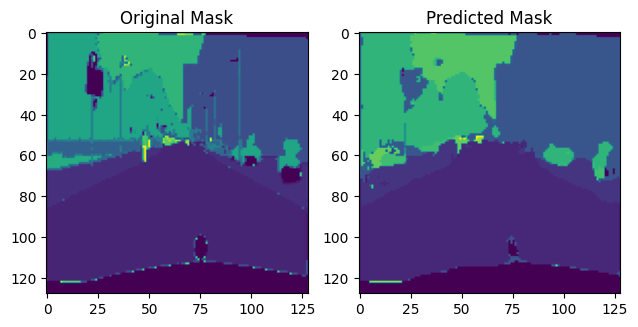

100/100 [==============================] - 91s 913ms/step - loss: 0.6554 - accuracy: 0.8261 - mean_iou: 0.2357 - val_loss: 0.9167 - val_accuracy: 0.7683 - val_mean_iou: 0.1960
Epoch 72/100
1/1 [==============================] - 0s 49ms/step


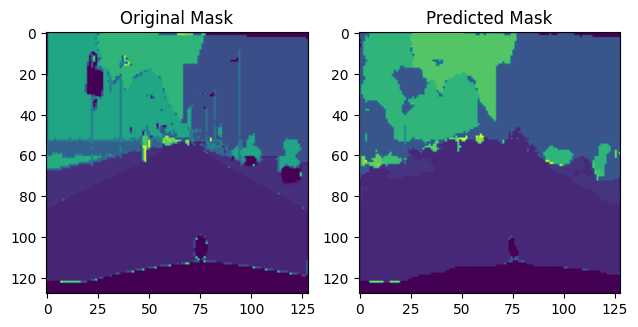

100/100 [==============================] - 92s 918ms/step - loss: 0.6523 - accuracy: 0.8270 - mean_iou: 0.2366 - val_loss: 0.9935 - val_accuracy: 0.7557 - val_mean_iou: 0.1893
Epoch 73/100
1/1 [==============================] - 0s 19ms/step


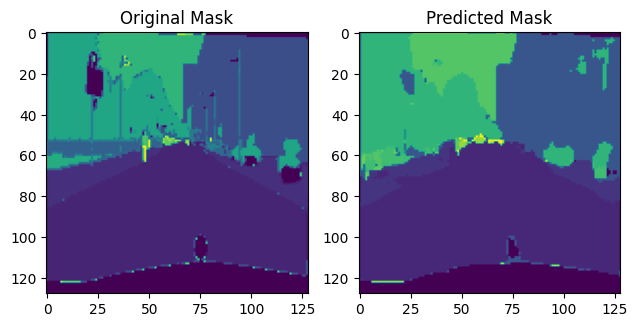

100/100 [==============================] - 91s 909ms/step - loss: 0.6420 - accuracy: 0.8292 - mean_iou: 0.2387 - val_loss: 1.6928 - val_accuracy: 0.6556 - val_mean_iou: 0.1307


In [13]:
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = 30, validation_data = (X_valid, Y_valid), callbacks=[early_stopping, viz_callback])

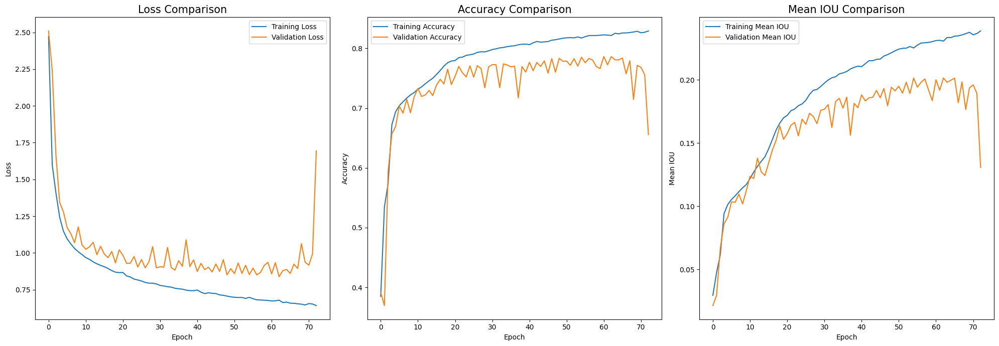

In [14]:
plot_history(history)

In [15]:
def plot_validation_preds(model, id_map):
    plt.style.use("default")
    for i in os.listdir("cityscapes_data/val/")[:3]:
        img, mask = preprocess(f"cityscapes_data/val/{i}", id_map)
        img = np.array(img)
        img = np.reshape(img, (1, 128, 128, 3))
        pred = model.predict(img)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (128, 128))
        fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(10, 5))
        img = np.reshape(img, (128, 128, 3))
        axes[0].imshow(img)
        axes[0].set_title("Original Image")
        axes[0].axis("off")
        axes[1].imshow(mask, cmap="viridis")
        axes[1].set_title("Original Mask")
        axes[1].axis("off")
        axes[2].imshow(y_pred, cmap="viridis")
        axes[2].set_title("Predicted Mask")
        axes[2].axis("off")

1/1 [==============================] - 0s 32ms/step


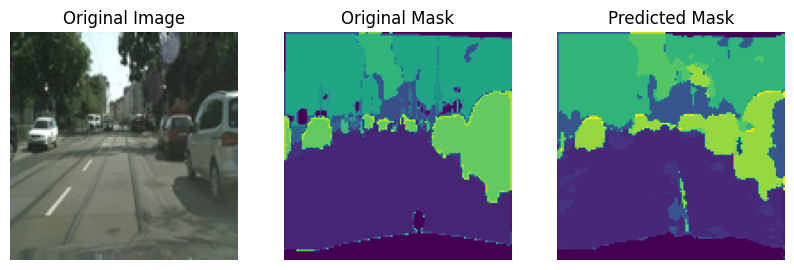

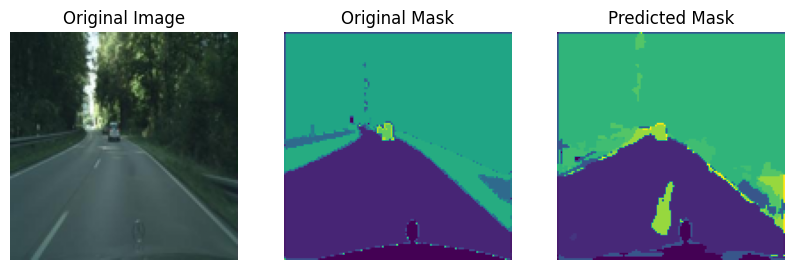

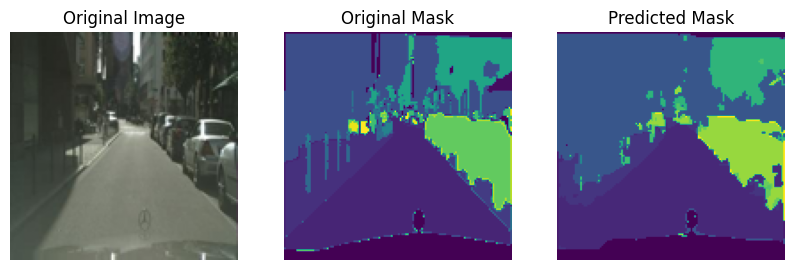

In [16]:
plot_validation_preds(model, id_map)

#### 2.6.2 U-NET

U-Net [https://link.springer.com/chapter/10.1007/978-3-319-24574-4_28] es una arquitectura para segmentación semántica. Consta de una rama de contracción y una rama de expansión. La ruta de contratación sigue la arquitectura típica de una red convolucional. Consiste en la aplicación repetida de dos convoluciones de 3x3, cada una seguida por una ReLU y una operación de max pooling de 2x2 con stride 2 para reducir la resolución.

En cada paso de reducción de resolución duplicamos el número de canales. Cada paso en la ruta expansiva consiste en un muestreo superior del feature map, seguido de un upsampling2D de 2x2 que reduce a la mitad el número de canales de características, despues mediante skip connections concatenamos las capas residuales correspondientes y dos convoluciones 3x3, cada una seguida de una ReLU. En la capa final, se utiliza una convolución de 1x1 para asignar cada pixel al número deseado de clases


<img src="https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-07_at_9.08.00_PM_rpNArED.png" alt="unet" width="600"/>

In [7]:
def get_unet_model(img_shape, num_classes):
    #Capa de Input
    inputs = tf.keras.layers.Input(shape = img_shape)

    #Primer Downsample
    feature_map_1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation='relu')(inputs)
    feature_map_1 = tf.keras.layers.BatchNormalization()(feature_map_1)
    feature_map_1 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(feature_map_1) #Usar despues en residual connection 4
    maxpooling_1 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(feature_map_1)
    maxpooling_1 = tf.keras.layers.Dropout(0.2)(maxpooling_1)

    #Segundo Downsample
    feature_map_2 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3) , padding = "same" , strides = 1, activation = 'relu')(maxpooling_1)
    feature_map_2 = tf.keras.layers.BatchNormalization()(feature_map_2)
    feature_map_2 = tf.keras.layers.Conv2D(128, kernel_size= (3, 3), padding = "same", strides = 1, activation = 'relu')(feature_map_2) #Usar despues en residual connection 3
    maxpooling_2 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(feature_map_2)
    maxpooling_2 = tf.keras.layers.Dropout(0.2)(maxpooling_2)

    #Tercer Downsample
    feature_map_3 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3) , padding = "same" , strides = 1, activation = 'relu')(maxpooling_2)
    feature_map_3 = tf.keras.layers.BatchNormalization()(feature_map_3)
    feature_map_3 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3) , padding = "same" , strides = 1, activation = 'relu')(feature_map_3) #Usar despues en residual connection 2
    maxpooling_3 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(feature_map_3)
    maxpooling_3 = tf.keras.layers.Dropout(0.2)(maxpooling_3)

    #Cuarto Downsample
    feature_map_4 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3) , padding = "same" , strides = 1, activation = 'relu')(maxpooling_3)
    feature_map_4 = tf.keras.layers.BatchNormalization()(feature_map_4)
    feature_map_4 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3) , padding = "same" , strides = 1, activation = 'relu')(feature_map_4) #Usar despues en residual connection 1
    maxpooling_4 = tf.keras.layers.MaxPooling2D(pool_size = (2, 2), strides = 2)(feature_map_4)
    maxpooling_4 = tf.keras.layers.Dropout(0.2)(maxpooling_4)

    #Quinto Downsample
    feature_map_5 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(maxpooling_4)
    feature_map_5 = tf.keras.layers.BatchNormalization()(feature_map_5)
    feature_map_5 = tf.keras.layers.Conv2D(1024, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(feature_map_5)

    #Primer Upsample
    upsample_1 = tf.keras.layers.UpSampling2D(size = (2, 2))(feature_map_5)
    upsample_1 = tf.keras.layers.Dropout(0.2)(upsample_1)
    upsample_1 = tf.keras.layers.Concatenate()([upsample_1, feature_map_4]) #Residual Connection 1
    upsample_1 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1 ,activation = "relu")(upsample_1)
    upsample_1 = tf.keras.layers.BatchNormalization()(upsample_1)
    upsample_1 = tf.keras.layers.Conv2D(512, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_1)

    #Segundo Upsample
    upsample_2 = tf.keras.layers.UpSampling2D(size = (2, 2))(upsample_1)
    upsample_2 = tf.keras.layers.Dropout(0.2)(upsample_2)
    upsample_2 = tf.keras.layers.Concatenate()([upsample_2, feature_map_3]) #Residual Connection 2
    upsample_2 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_2)
    upsample_2 = tf.keras.layers.BatchNormalization()(upsample_2)
    upsample_2 = tf.keras.layers.Conv2D(256, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_2)

    #Tercer Upsample
    upsample_3 = tf.keras.layers.UpSampling2D(size = (2, 2))(upsample_2)
    upsample_3 = tf.keras.layers.Dropout(0.2)(upsample_3)
    upsample_3 = tf.keras.layers.Concatenate()([upsample_3, feature_map_2]) #Residual Connection 3
    upsample_3 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_3)
    upsample_3 = tf.keras.layers.BatchNormalization()(upsample_3)
    upsample_3 = tf.keras.layers.Conv2D(128, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_3)

    #Cuarto Upsample
    upsample_4 = tf.keras.layers.UpSampling2D(size = (2, 2))(upsample_3)
    upsample_4 = tf.keras.layers.Dropout(0.2)(upsample_4)
    upsample_4 = tf.keras.layers.Concatenate()([upsample_4, feature_map_1]) #Residual Connection 3
    upsample_4 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_4)
    upsample_4 = tf.keras.layers.BatchNormalization()(upsample_4)
    upsample_4 = tf.keras.layers.Conv2D(64, kernel_size = (3, 3), padding = "same", strides = 1, activation = "relu")(upsample_4)

    #Capa de Salida
    outputs = tf.keras.layers.Conv2D(num_classes, kernel_size = (3, 3), padding = "same", strides = 1, activation = "softmax")(upsample_4)

    model = tf.keras.Model(inputs = [inputs], outputs = [outputs])

    return model

In [14]:
model = get_unet_model(img_shape=X_train.shape[1:], num_classes=num_classes)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 64)         36928     ['batch_normalization[0][0

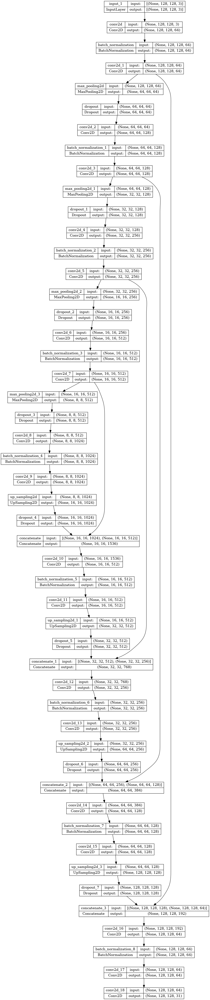

In [ ]:
tf.keras.utils.plot_model(model, show_shapes = True)

### 2.7 Entrenamiento

#### 2.7.1 Hiperparámetros

In [15]:
unet_opt = tf.keras.optimizers.Adam()
unet_loss = "sparse_categorical_crossentropy" # Utilizar la función de pérdida "sparse categorical crossentropy"
unet_metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes, name = "mean_iou")]

In [16]:
model.compile(loss = unet_loss, optimizer = unet_opt, metrics = unet_metrics)

#### 2.7.2 Callbacks

In [17]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience = 10, restore_best_weights = True)
viz_callback = VizCallback("cityscapes_data/val/106.jpg")
unet_callbacks = [early_stopping, viz_callback] # Utilizar los callbacks de early stopping y viz_callback en una lista para pasarselos al modelo

#### 2.7.3 Entrenando U-Net

Epoch 1/100
1/1 [==============================] - 1s 1s/step


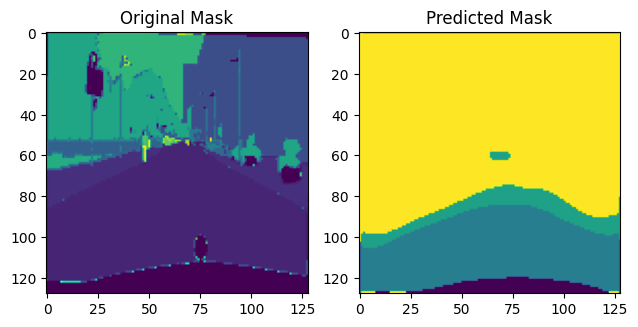

186/186 [==============================] - 102s 403ms/step - loss: 1.0702 - accuracy: 0.7094 - mean_iou: 0.1403 - val_loss: 2.2227 - val_accuracy: 0.4144 - val_mean_iou: 0.0443
Epoch 2/100
1/1 [==============================] - 0s 20ms/step


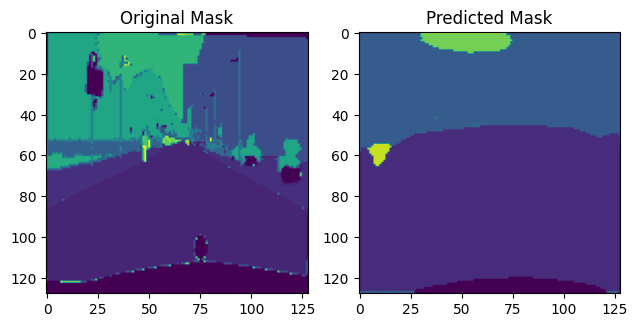

186/186 [==============================] - 63s 340ms/step - loss: 0.8312 - accuracy: 0.7759 - mean_iou: 0.1995 - val_loss: 2.7130 - val_accuracy: 0.5386 - val_mean_iou: 0.0597
Epoch 3/100
1/1 [==============================] - 0s 18ms/step


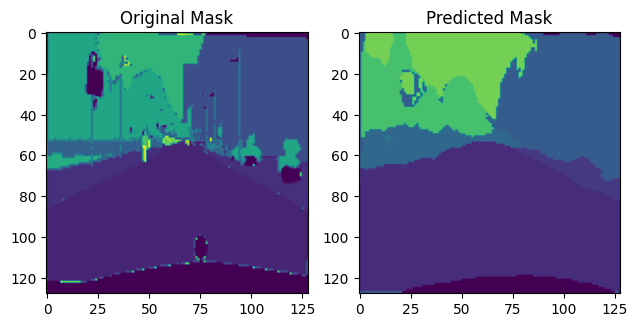

186/186 [==============================] - 63s 341ms/step - loss: 0.7450 - accuracy: 0.7991 - mean_iou: 0.2244 - val_loss: 1.4456 - val_accuracy: 0.6552 - val_mean_iou: 0.1235
Epoch 4/100
1/1 [==============================] - 0s 19ms/step


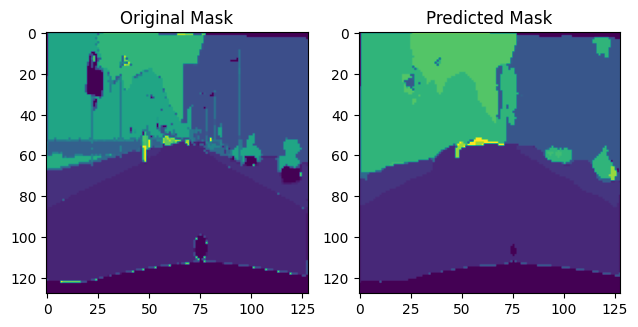

186/186 [==============================] - 62s 334ms/step - loss: 0.6861 - accuracy: 0.8129 - mean_iou: 0.2435 - val_loss: 0.8140 - val_accuracy: 0.7790 - val_mean_iou: 0.2136
Epoch 5/100
1/1 [==============================] - 0s 26ms/step


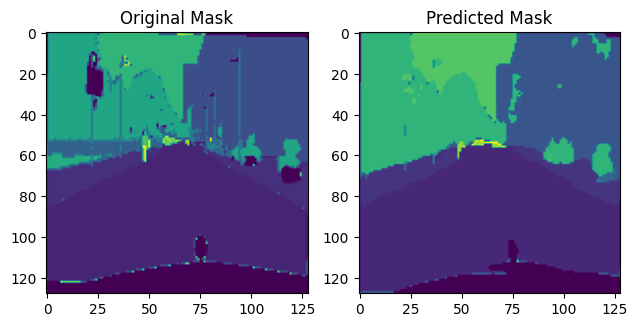

186/186 [==============================] - 63s 341ms/step - loss: 0.6545 - accuracy: 0.8196 - mean_iou: 0.2569 - val_loss: 0.8679 - val_accuracy: 0.7771 - val_mean_iou: 0.2215
Epoch 6/100
1/1 [==============================] - 0s 28ms/step


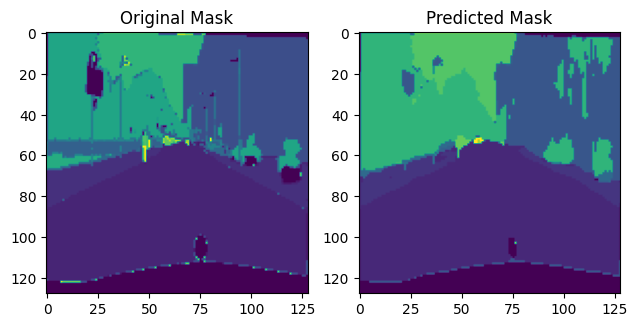

186/186 [==============================] - 63s 340ms/step - loss: 0.6227 - accuracy: 0.8263 - mean_iou: 0.2687 - val_loss: 0.7672 - val_accuracy: 0.7965 - val_mean_iou: 0.2394
Epoch 7/100
1/1 [==============================] - 0s 17ms/step


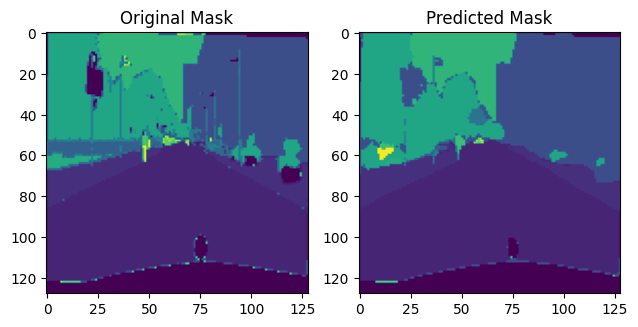

186/186 [==============================] - 63s 337ms/step - loss: 0.5993 - accuracy: 0.8321 - mean_iou: 0.2834 - val_loss: 0.7685 - val_accuracy: 0.7837 - val_mean_iou: 0.2357
Epoch 8/100
1/1 [==============================] - 0s 26ms/step


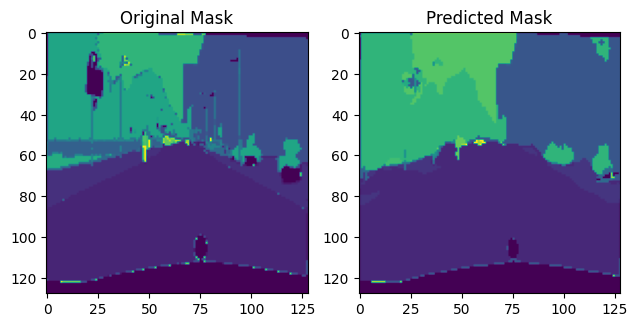

186/186 [==============================] - 64s 346ms/step - loss: 0.5852 - accuracy: 0.8357 - mean_iou: 0.2932 - val_loss: 0.7000 - val_accuracy: 0.8075 - val_mean_iou: 0.2525
Epoch 9/100
1/1 [==============================] - 0s 18ms/step


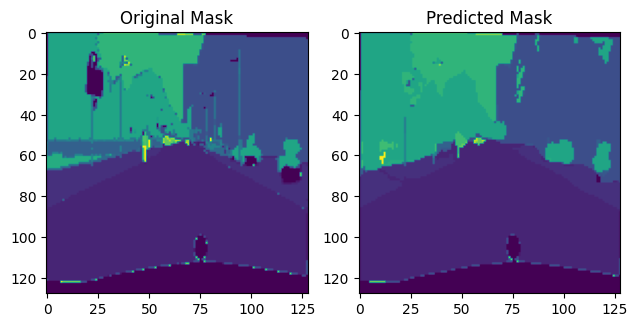

186/186 [==============================] - 63s 337ms/step - loss: 0.5650 - accuracy: 0.8400 - mean_iou: 0.3055 - val_loss: 0.6685 - val_accuracy: 0.8118 - val_mean_iou: 0.2625
Epoch 10/100
1/1 [==============================] - 0s 18ms/step


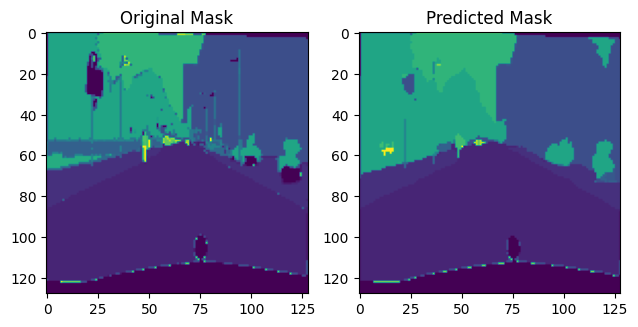

186/186 [==============================] - 63s 341ms/step - loss: 0.5500 - accuracy: 0.8432 - mean_iou: 0.3149 - val_loss: 0.6239 - val_accuracy: 0.8240 - val_mean_iou: 0.2790
Epoch 11/100
1/1 [==============================] - 0s 27ms/step


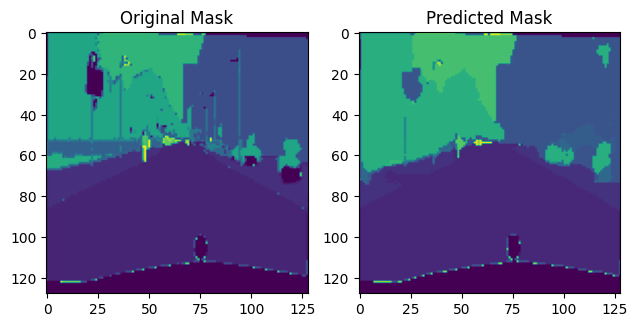

186/186 [==============================] - 64s 343ms/step - loss: 0.5345 - accuracy: 0.8472 - mean_iou: 0.3272 - val_loss: 0.6176 - val_accuracy: 0.8285 - val_mean_iou: 0.2908
Epoch 12/100
1/1 [==============================] - 0s 19ms/step


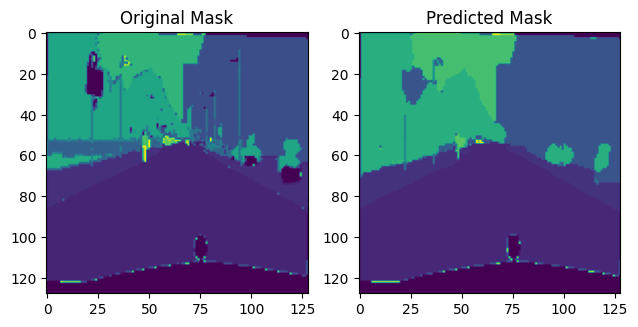

186/186 [==============================] - 62s 336ms/step - loss: 0.5247 - accuracy: 0.8494 - mean_iou: 0.3327 - val_loss: 0.6137 - val_accuracy: 0.8248 - val_mean_iou: 0.2917
Epoch 13/100
1/1 [==============================] - 0s 18ms/step


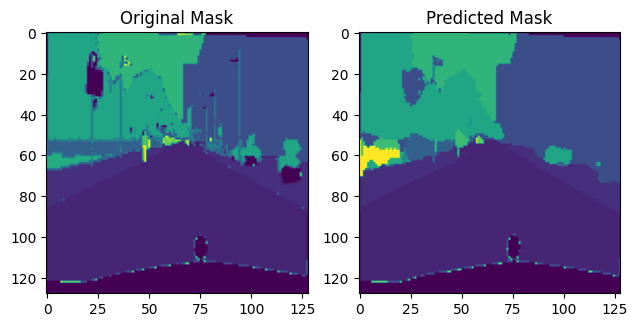

186/186 [==============================] - 64s 346ms/step - loss: 0.5094 - accuracy: 0.8540 - mean_iou: 0.3472 - val_loss: 0.6708 - val_accuracy: 0.8153 - val_mean_iou: 0.2816
Epoch 14/100
1/1 [==============================] - 0s 18ms/step


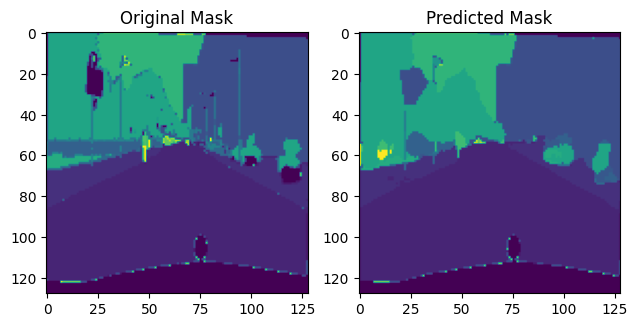

186/186 [==============================] - 63s 337ms/step - loss: 0.4997 - accuracy: 0.8560 - mean_iou: 0.3552 - val_loss: 0.6277 - val_accuracy: 0.8254 - val_mean_iou: 0.2963
Epoch 15/100
1/1 [==============================] - 0s 18ms/step


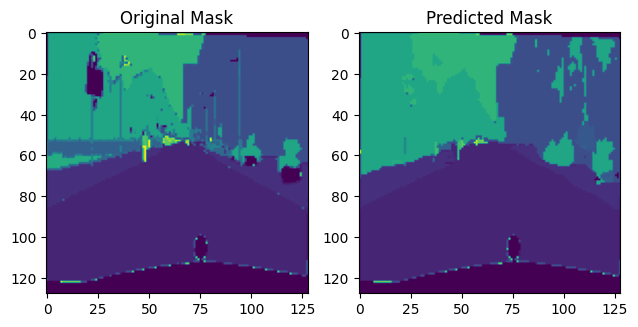

186/186 [==============================] - 63s 340ms/step - loss: 0.4864 - accuracy: 0.8594 - mean_iou: 0.3645 - val_loss: 0.6417 - val_accuracy: 0.8168 - val_mean_iou: 0.2877
Epoch 16/100
1/1 [==============================] - 0s 27ms/step


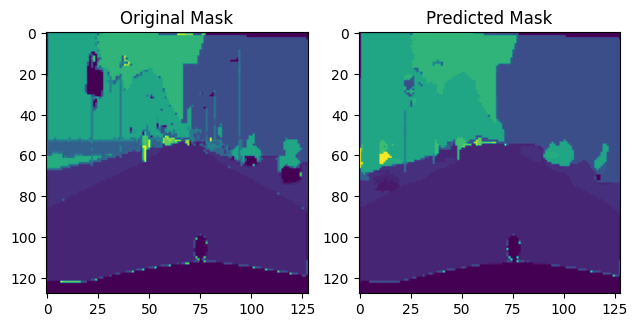

186/186 [==============================] - 63s 340ms/step - loss: 0.4817 - accuracy: 0.8607 - mean_iou: 0.3705 - val_loss: 0.6730 - val_accuracy: 0.8115 - val_mean_iou: 0.2916
Epoch 17/100
1/1 [==============================] - 0s 18ms/step


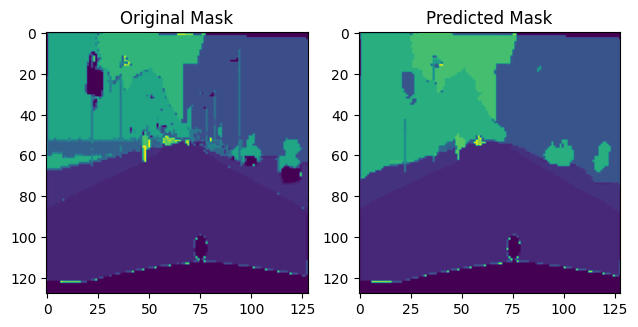

186/186 [==============================] - 63s 338ms/step - loss: 0.4736 - accuracy: 0.8639 - mean_iou: 0.3788 - val_loss: 0.5933 - val_accuracy: 0.8320 - val_mean_iou: 0.3090
Epoch 18/100
1/1 [==============================] - 0s 18ms/step


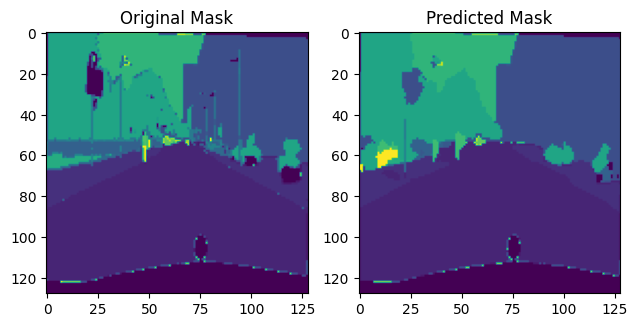

186/186 [==============================] - 64s 344ms/step - loss: 0.4541 - accuracy: 0.8688 - mean_iou: 0.3943 - val_loss: 0.6283 - val_accuracy: 0.8232 - val_mean_iou: 0.2988
Epoch 19/100
1/1 [==============================] - 0s 18ms/step


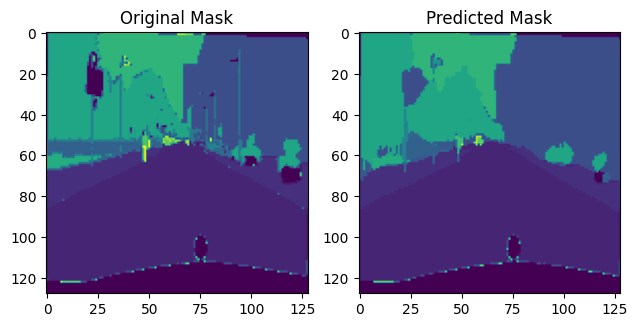

186/186 [==============================] - 62s 335ms/step - loss: 0.4488 - accuracy: 0.8701 - mean_iou: 0.3971 - val_loss: 0.6348 - val_accuracy: 0.8196 - val_mean_iou: 0.2947
Epoch 20/100
1/1 [==============================] - 0s 19ms/step


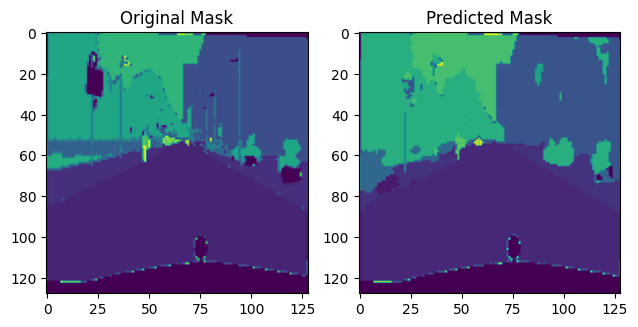

186/186 [==============================] - 64s 346ms/step - loss: 0.4400 - accuracy: 0.8726 - mean_iou: 0.4091 - val_loss: 0.6268 - val_accuracy: 0.8241 - val_mean_iou: 0.3032
Epoch 21/100
1/1 [==============================] - 0s 18ms/step


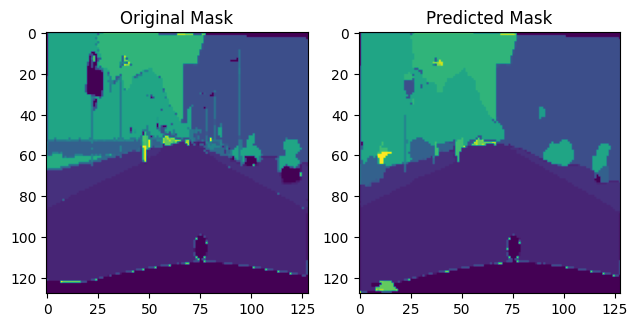

186/186 [==============================] - 62s 334ms/step - loss: 0.4321 - accuracy: 0.8747 - mean_iou: 0.4165 - val_loss: 0.6491 - val_accuracy: 0.8234 - val_mean_iou: 0.3041
Epoch 22/100
1/1 [==============================] - 0s 18ms/step


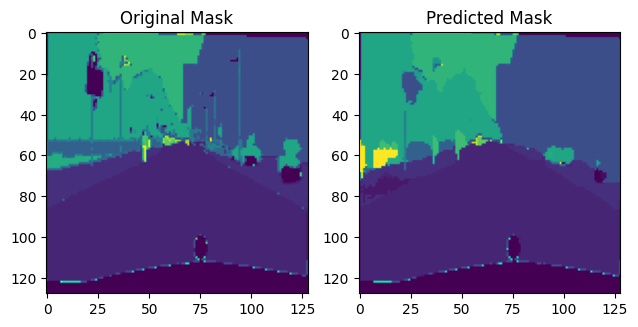

186/186 [==============================] - 64s 342ms/step - loss: 0.4264 - accuracy: 0.8764 - mean_iou: 0.4255 - val_loss: 0.6094 - val_accuracy: 0.8279 - val_mean_iou: 0.3063
Epoch 23/100
1/1 [==============================] - 0s 37ms/step


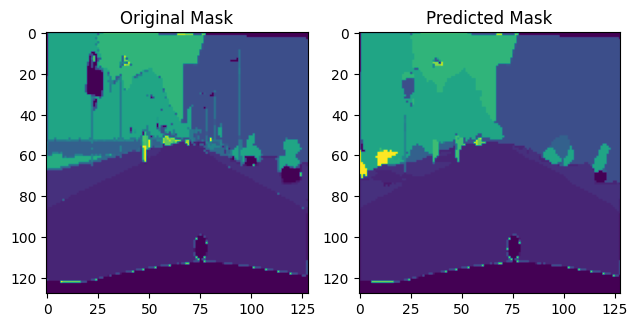

186/186 [==============================] - 64s 343ms/step - loss: 0.4139 - accuracy: 0.8799 - mean_iou: 0.4320 - val_loss: 0.5933 - val_accuracy: 0.8378 - val_mean_iou: 0.3162
Epoch 24/100
1/1 [==============================] - 0s 18ms/step


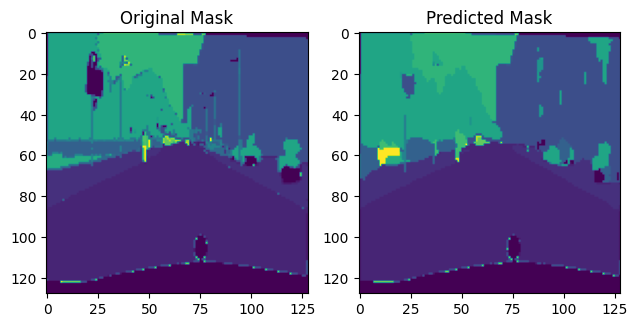

186/186 [==============================] - 62s 335ms/step - loss: 0.4014 - accuracy: 0.8833 - mean_iou: 0.4430 - val_loss: 0.6477 - val_accuracy: 0.8307 - val_mean_iou: 0.3091
Epoch 25/100
1/1 [==============================] - 0s 32ms/step


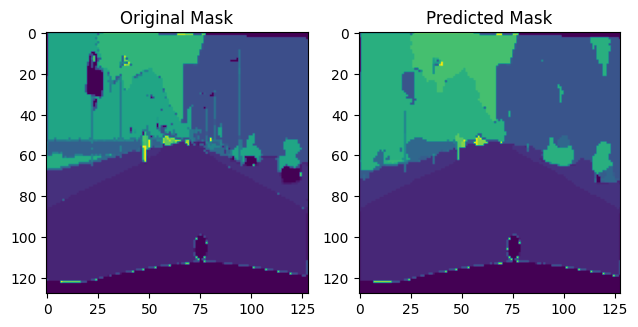

186/186 [==============================] - 64s 345ms/step - loss: 0.4034 - accuracy: 0.8827 - mean_iou: 0.4413 - val_loss: 0.6417 - val_accuracy: 0.8357 - val_mean_iou: 0.3206
Epoch 26/100
1/1 [==============================] - 0s 18ms/step


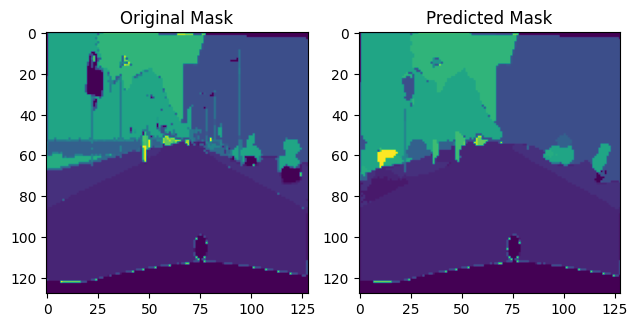

186/186 [==============================] - 62s 336ms/step - loss: 0.3926 - accuracy: 0.8856 - mean_iou: 0.4529 - val_loss: 0.5974 - val_accuracy: 0.8407 - val_mean_iou: 0.3332
Epoch 27/100
1/1 [==============================] - 0s 19ms/step


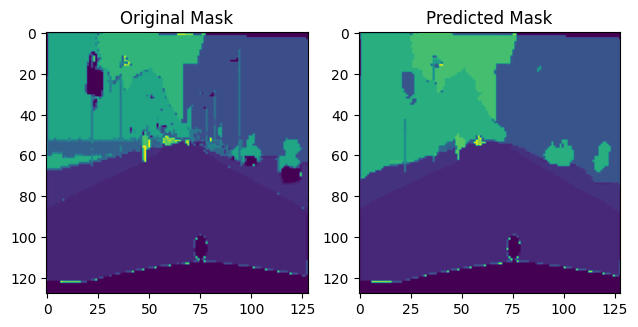

186/186 [==============================] - 64s 345ms/step - loss: 0.3763 - accuracy: 0.8901 - mean_iou: 0.4707 - val_loss: 0.5933 - val_accuracy: 0.8436 - val_mean_iou: 0.3347


In [18]:
history = model.fit(x=X_train, y=Y_train, epochs = 100, batch_size = 16, validation_data = (X_valid, Y_valid), callbacks=unet_callbacks)

### 2.8 Resultados del Entrenamiento

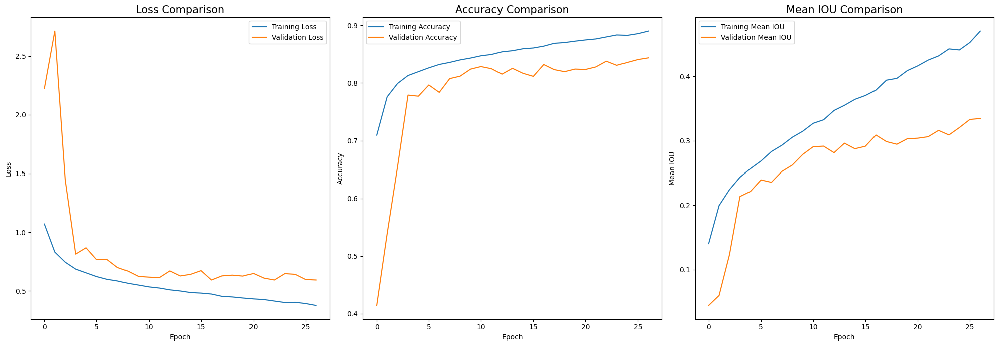

In [19]:
plot_history(history)

### 2.9 Prediccion en el Set de test

In [20]:
def plot_validation_preds(model, id_map):
    plt.style.use("default")
    for i in os.listdir("cityscapes_data/val/")[:3]:
        img, mask = preprocess(f"cityscapes_data/val/{i}", id_map)
        img = np.array(img)
        img = np.reshape(img, (1, 128, 128, 3))
        pred = model.predict(img)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (128, 128))
        fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(10, 5))
        img = np.reshape(img, (128, 128, 3))
        axes[0].imshow(img)
        axes[0].set_title("Original Image")
        axes[0].axis("off")
        axes[1].imshow(mask, cmap="viridis")
        axes[1].set_title("Original Mask")
        axes[1].axis("off")
        axes[2].imshow(y_pred, cmap="viridis")
        axes[2].set_title("Predicted Mask")
        axes[2].axis("off")

1/1 [==============================] - 0s 18ms/step


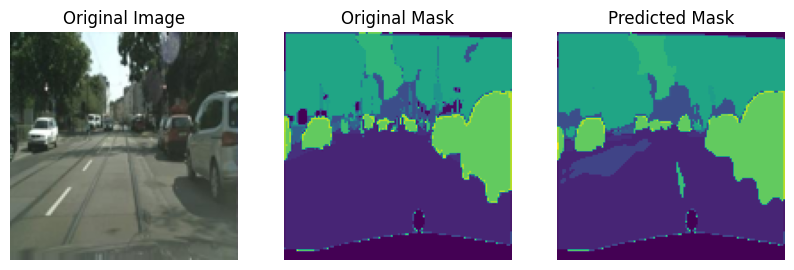

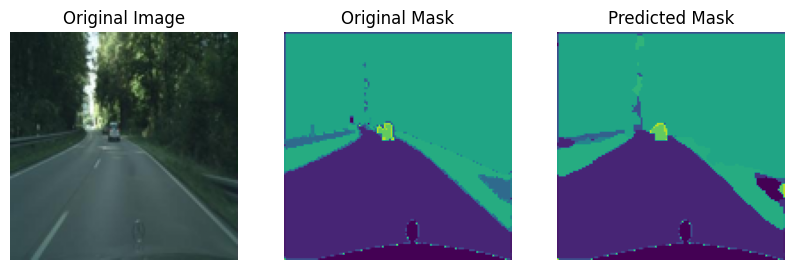

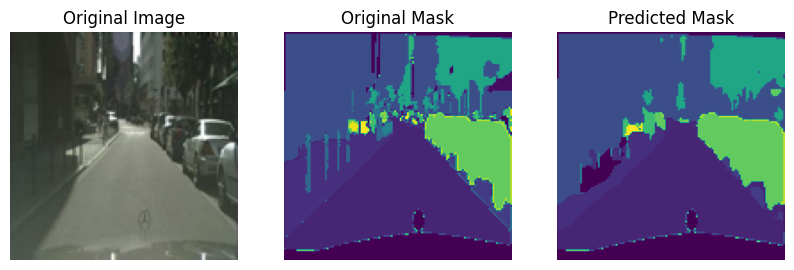

In [21]:
plot_validation_preds(model, id_map)